In [1]:
import numpy as np
import os
import time
import scipy
import glob

from datetime import datetime
import pandas as pd
import pylab as pl
#import matplotlib.pyplot as pl
#import chart_studio.plotly as py

from scipy.stats import binned_statistic_2d

import utils as util
import importlib
import behavior as butil

In [2]:
import matplotlib as mpl
mpl.use('nbagg')
import seaborn as sns

In [3]:
#import plotly.offline as py
#from plotly.offline import init_notebook_mode, iplot

# import pandas as pd
#import plotly.graph_objs as go
#import plotly.graph_objects as go

#import chart_studio.plotly as py
#import plotly.graph_objects as go
#import plotly.express as px

#import plotly.io as pio
#from plotly.subplots import make_subplots


In [151]:
#pio.templates.default = 'plotly_dark'

In [4]:
#py.init_notebook_mode(connected=True)         # initiate notebook for offline plot


## load data

In [5]:
root_dir = '/Users/julianarhee/Library/CloudStorage/GoogleDrive-edge.tracking.ru@gmail.com/My Drive/Edge_Tracking/Data'
experiment = 'Spontaneous_edge_tracking'
# experiment = 'hdeltac/csv'
# experiment = 'hdeltac'
# 'hdeltac/csv/20220517_hdc_split_60d05_sytgcamp7f'
src_dir = os.path.join(root_dir, experiment)
# src_dir = '/Users/julianarhee/Documents/rutalab/data/test'
print(src_dir)

/Users/julianarhee/Library/CloudStorage/GoogleDrive-edge.tracking.ru@gmail.com/My Drive/Edge_Tracking/Data/Spontaneous_edge_tracking


In [6]:
# log_files = glob.glob(os.path.join(src_dir, '2022*', 'et', '*.csv'))
log_files = sorted(glob.glob(os.path.join(src_dir, '*.log')), key=util.natsort)
print("Found {} raw .log behavior files.".format(len(log_files)))

Found 13 raw .log behavior files.


In [7]:
%matplotlib notebook

In [58]:
importlib.reload(util)

<module 'utils' from '/Users/julianarhee/Repositories/plume-tracking/utils.py'>

In [59]:
util.set_sns_style(style='dark')

<IPython.core.display.Javascript object>


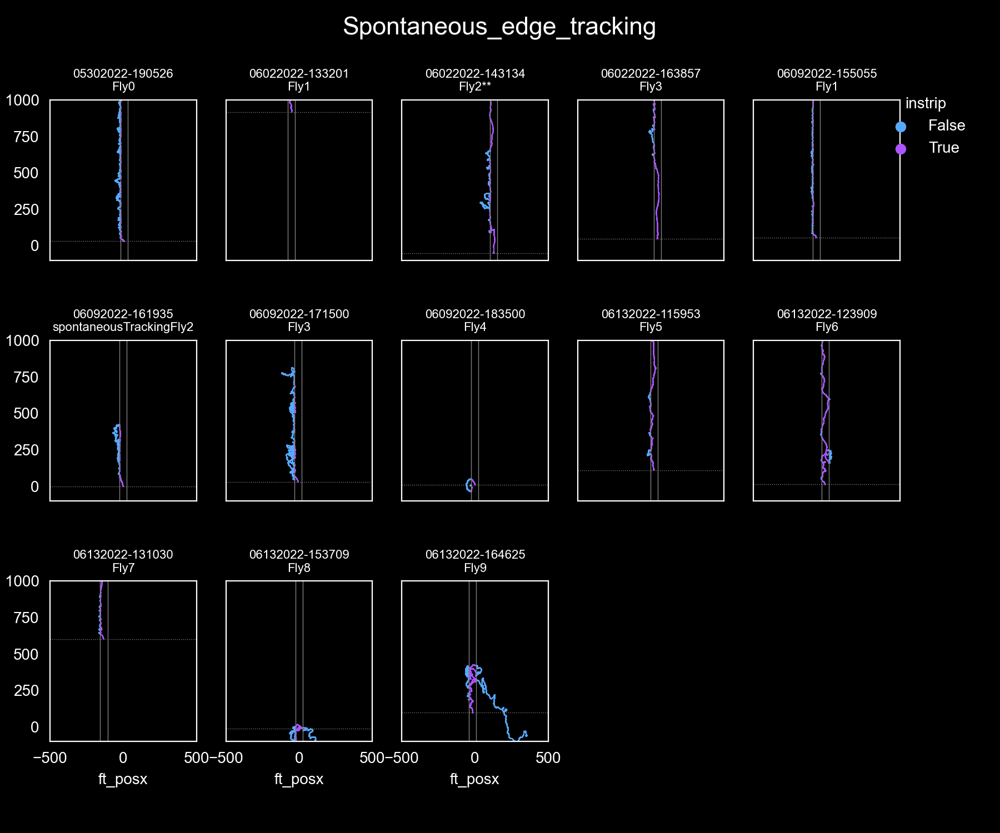

Text(0.5, 0.98, 'Spontaneous_edge_tracking')

In [61]:
hue_varname='instrip'
palette='cool'
is_csv = False
start_at_odor = True
odor_lc='lightgray'
odor_lw=0.5
nrows = 3
ncols = 5

xmin, xmax = (-500, 500)
ymin, ymax = (-100, 1000)
odor_xmin, odor_xmax = (-100, 100)
fig, axes = pl.subplots(nrows, ncols, sharex=True, sharey=True, figsize=(nrows*3, ncols*1.5))
for fi, fpath in enumerate(log_files):
    # load data
    if is_csv:
        df0 = butil.load_dataframe_resampled_csv(fpath)
    else:
        df0 = butil.load_dataframe(fpath) 
    if df0 is None:
        print("error:", fn)
        continue
    #odor params
    odor_params = butil.get_odor_params(df0, odor_width=50)
    odor_xmin, odor_xmax = odor_params['odor_boundary']
    odor_start_posx, odor_start_posy = odor_params['odor_start_pos']
    plotdf = df0[df0['time']>=odor_params['odor_start_time']] if start_at_odor else df0
    # set subplot
    fn = os.path.splitext(os.path.split(fpath)[-1])[0]
    title = '{}, {}{}{}'.format(fi, fn.split('_')[0], '\n', fn.split('_')[-1])
    ax = axes.flat[fi]
    ax.set_title(title, fontsize=8)
    # plot
    sns.scatterplot(data=plotdf, x='ft_posx', y='ft_posy', hue=hue_varname,
                    palette=palette, s=0.5, ax=ax, linewidth=0) #'none')
    ax.get_legend().remove()
    # add odor corridor
    butil.center_odor_path(ax, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
    butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax,
                    odor_start_posy=odor_start_posy)
# remove unused axes
for ix in np.arange(fi+1, nrows*ncols):
    axes.flat[ix].axis('off')
# legend
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(0.98, 0.9), ncol=1,
           loc='upper right', title=hue_varname, frameon=False) 
# adjust plots
pl.subplots_adjust(hspace=0.5, left=0.05, right=0.9)
fig.suptitle(experiment, fontsize=16)

## individual fly

In [440]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [439]:
fpath = log_files[0]
_, fn = os.path.split(fpath)
print(fn)
df0 = butil.load_dataframe(fpath)
odor_params = butil.get_odor_params(df0, odor_width=50)
odor_xmin, odor_xmax = odor_params['odor_boundary']
odor_start_posx, odor_start_posy = odor_params['odor_start_pos']
print("Fly position at odor start: ({:.2f}, {:.2f})".format(odor_start_posx, odor_start_posy))

05302022-190526_constantOdor_Fly0.log


In [442]:
df = butil.parse_bouts(df0, count_varname='instrip', bout_varname='boutnum') # 1-count
df = butil.filter_bouts_by_dur(df, bout_thresh=0.5, bout_varname='boutnum', 
                        count_varname='instrip', verbose=False)
boutdurs = butil.get_bout_durs(df, bout_varname='boutnum')
# check if any too short
too_short = [k for k, v in boutdurs.items() if v<0.5]
too_short

#### plot bouts 

<IPython.core.display.Javascript object>


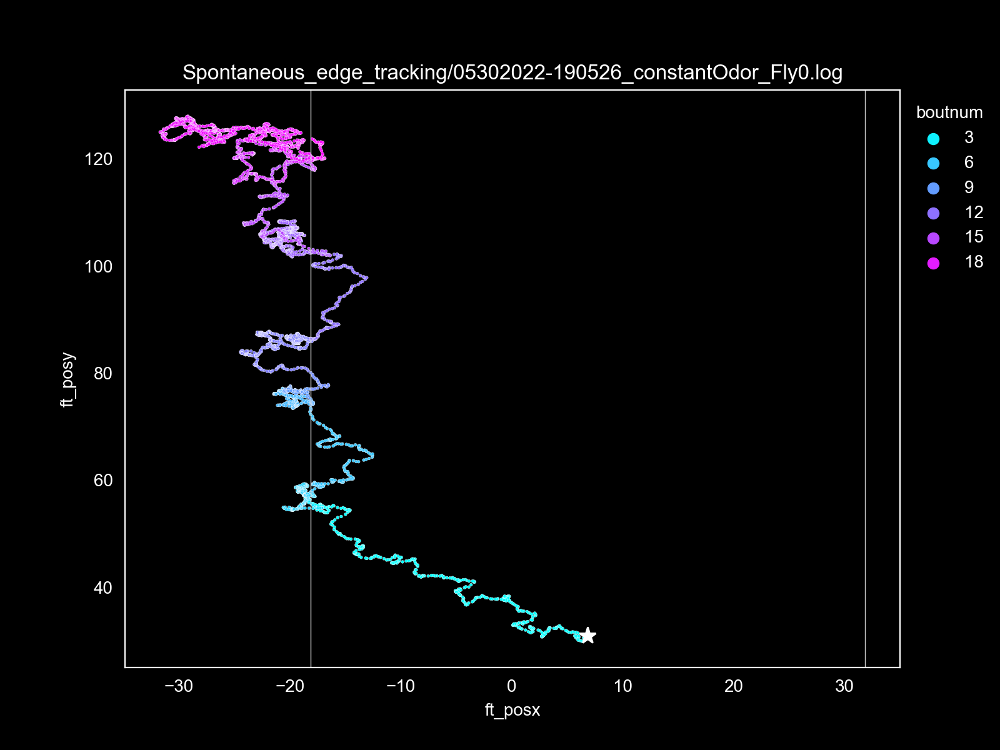

Text(0.5, 1.0, 'Spontaneous_edge_tracking/05302022-190526_constantOdor_Fly0.log')

In [445]:
start_at_odor=True
hue_varname='boutnum'
nbouts_plot=20
plotdf = df[df['time']>=odor_params['odor_start_time']] if start_at_odor else df.copy()
plotdf = plotdf[plotdf['boutnum']<=nbouts_plot].copy() #[df0['time']>=odor_start_time].copy()
fig, ax = pl.subplots(figsize=(8,6))
sns.scatterplot(data=plotdf, x='ft_posx', y='ft_posy', hue=hue_varname, palette=palette,
               s=3, ax=ax)
ax.plot(odor_start_posx, odor_start_posy, 'w*', markersize=10) 
ax.axvline(x=odor_xmin, c=odor_lc, lw=odor_lw) 
ax.axvline(x=odor_xmax, c=odor_lc, lw=odor_lw) 
if not start_at_odor:
    ax.axhline(odor_start_posy, 'w:')
ax.legend(bbox_to_anchor=(1,1), loc='upper left', title=hue_varname, frameon=False)
ax.set_title('{}/{}'.format(experiment, fn))

## Parse in/out bouts

In [446]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [447]:
# bout_thresh = 0.5
# # df = butil.filter_bouts_by_dur(df0, count_varname='instrip', bout_varname='boutnum')
# # df = butil.parse_bouts(df, count_varname='instrip', bout_varname='boutnum')
# # boutdurs = butil.get_bout_durs(df, bout_varname='boutnum')
# #boutdurs
# df = df0.copy()
# boutdurs = butil.get_bout_durs(df, bout_varname='boutnum')
# print(len(boutdurs.keys()))

# speed

In [448]:
## calculate instantaneous vel
window_size=53
df = butil.calculate_speed(df, smooth=True, window_size=window_size, return_same=True)
## Add dist traveled at each ste
df['dist'] = np.linalg.norm(df[['ft_posx', 'ft_posy']].diff(axis=0), axis=1)

#### plot vel vs time

In [449]:
tsteps = df['time'].diff()
# fig, ax = pl.subplots()
# sns.histplot(df['time'], ax=ax)
print('Time steps: {:.2f}-{:.2f} sec'.format(tsteps.min(), tsteps.max()))

Time steps: 0.02-0.30 sec


In [450]:
# window_size = 11
#df['smoothed_speed'] = util.smooth_timecourse(df['speed'], window_size)
# df['smoothed_speed'] = util.temporal_downsample(df['speed'], window_size)

<IPython.core.display.Javascript object>


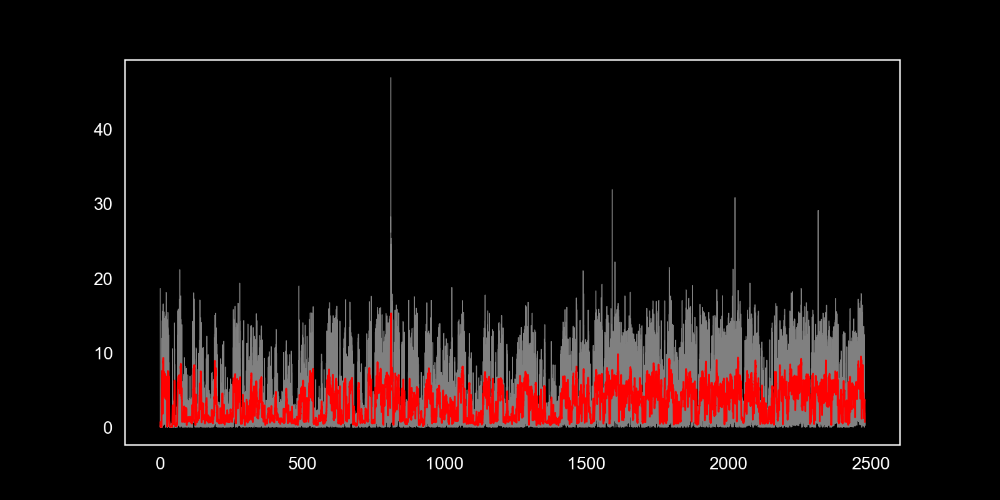

In [451]:
plot_smoothed_timeseries = True
if plot_smoothed_timeseries:
    fig, ax = pl.subplots(figsize=(8,4))
    ax.plot(df['cum_time'], df['speed'], color='gray', lw=0.5) #, name='raw')
    ax.plot(df['cum_time'], df['smoothed_speed'], 'r', lw=1)
    #ax.plot(df['cum_time'], df['smoothed_speed2'], 'b', lw=0.5)
#     sns.scatterplot(data=df, x='cum_time', y='smoothed_speed', hue='instrip', 
#                     palette='cool', ax=ax, s=1, zorder=100, linewidth=0)

<IPython.core.display.Javascript object>


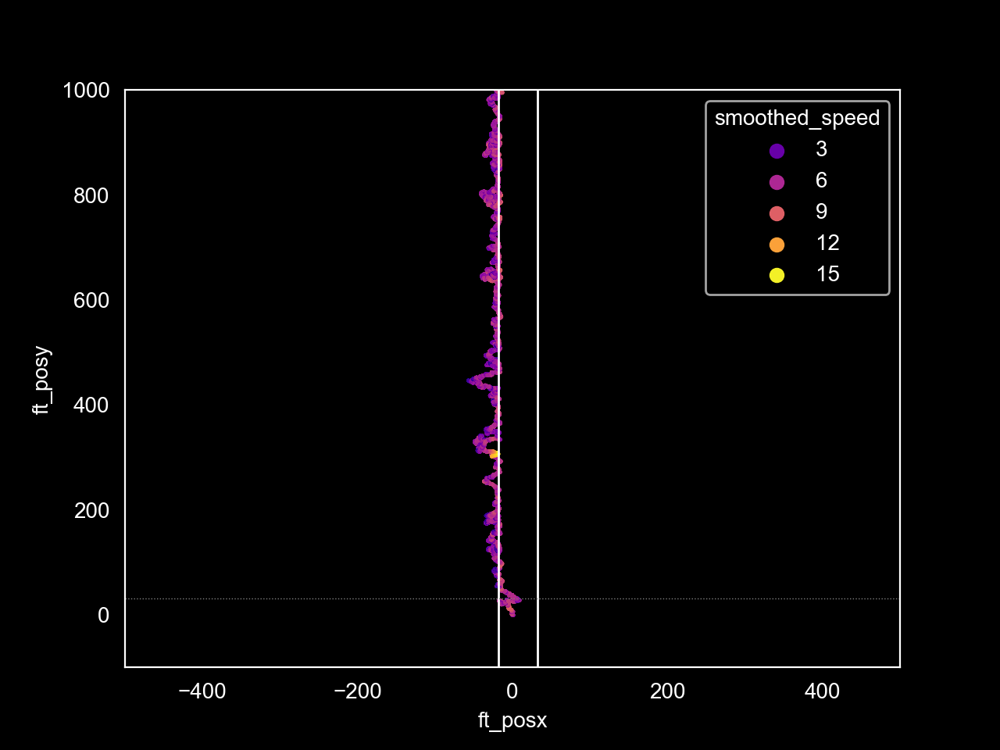

In [452]:
#df=df0.copy()
#df =  df0.copy() #df0.loc[0:int(round(df0.shape[0]/2))].copy()
hue_var = 'smoothed_speed'
colorscale='magma'
colorscale_title = 'Inst speed (mm/s)' if hue_var=='smoothed_speed' else ''
figure_title = 'Plume trajectory \n{}'.format(fn)
marker_kws = dict(colorbar=dict(title=colorscale_title),
                  colorscale="plasma")
fig, ax = pl.subplots()
sns.scatterplot(data=df, x='ft_posx', y='ft_posy', hue=hue_var, s=3,
                palette='plasma', ax=ax, edgecolor='none')
butil.plot_odor_corridor(ax, odor_xmin=odor_xmin, odor_xmax=odor_xmax, \
                               odor_linecolor='white', odor_linewidth=1,
                               odor_start_posy=odor_start_posy)
butil.center_odor_path(ax)

# Outbouts

In [453]:
plot_all_outbouts=False
if plot_all_outbouts:
    fig, ax = pl.subplots(figsize=(5, 8))
    for i, (boutnum, currdf) in enumerate(df[~df['instrip']].groupby('boutnum')):
        if i==0:
            continue
        sns.scatterplot(data=currdf, x='ft_posx', y='ft_posy', ax=ax,
                        hue='smoothed_speed', legend=False, edgecolor='none',
                        palette='plasma', s=2)
    ax.axvline(x=odor_xmin, c='white')
    ax.axvline(x=odor_xmax, c='white')

<IPython.core.display.Javascript object>


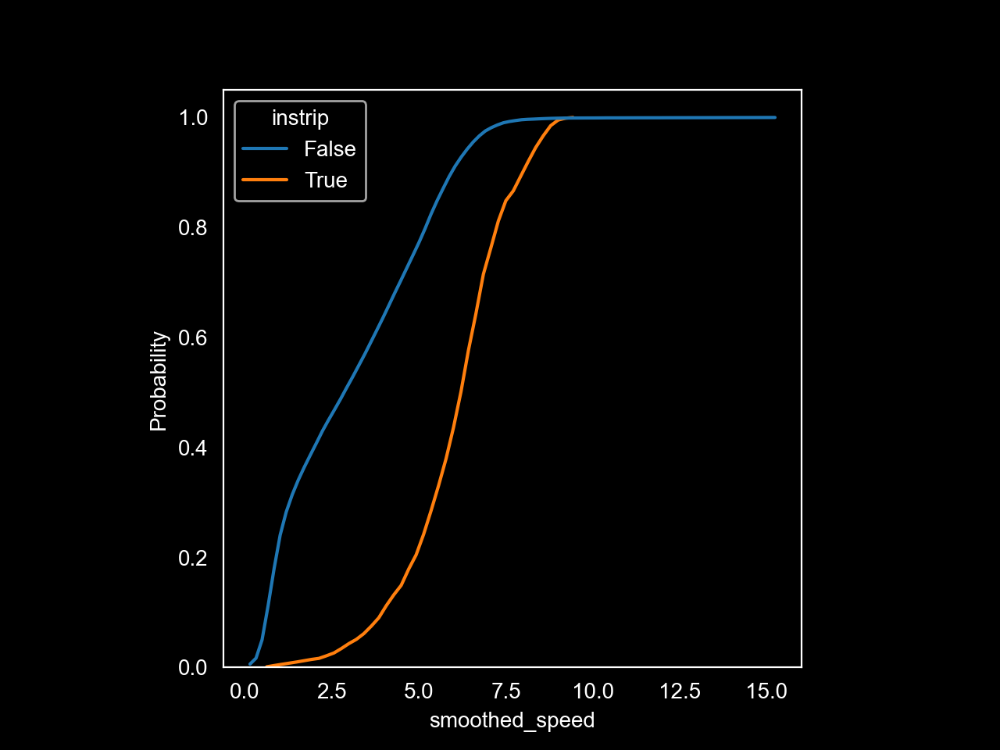

In [454]:
speed_varname = 'smoothed_speed'
vmin, vmax = df['speed'].min(), df['speed'].max()
fig, ax = pl.subplots()
sns.histplot(data=df, x=speed_varname, hue='instrip', ax=ax, 
             stat='probability', cumulative=True, 
             common_bins=False, common_norm=False, element='poly', fill=False)
ax.set_box_aspect(1)

# Calculate stops

In [456]:
# Calculate stops
stop_thresh = 1.0
df1 = butil.calculate_stops(df, stop_thresh=stop_thresh, speed_varname='smoothed_speed')
#df = butil.parse_bouts(df, count_varname='stopped', bout_varname='stopbout')

In [457]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [574]:
df2 = butil.filter_bouts_by_dur(df1, bout_thresh=0.1, bout_varname='stopbout', 
                        count_varname='stopped', verbose=True)
nstops = len(df2[df2['stopped']==True]['stopbout'].unique())
nstops

Found 0 bouts too short (thr=0.10 sec)


225

In [575]:
df = butil.parse_bouts(df2, count_varname='stopped', bout_varname='stopbout')

#### are num stops correlated with dist traveled?

In [602]:
# # stopbout_durs = butil.get_bout_durs(df[df['stopped']], bout_varname='stopbout')
# stopbout_durs = butil.get_bout_durs(df[df['stopped']], bout_varname='stopbout')

# # stopbout_durs
# stopbouts = pd.DataFrame(data=stopbout_durs.values(), index=stopbout_durs.keys(), 
#                         columns=['duration'])
# stopbouts['instrip'] = [df[df['stopbout']==i]['instrip'].unique()[0] for i in stopdurs.index.tolist()]
# stopbouts['boutnum'] = [df[df['stopbout']==i]['boutnum'].unique()[0] for i in stopdurs.index.tolist()]
# stopbouts

In [591]:
# stopbout_durs = butil.get_bout_durs(df[df['stopped']], bout_varname='stopbout')
stopdurs = butil.get_bout_durs(df[df['stopped']], bout_varname='stopbout')
# Get durs & dists
stopbouts = pd.DataFrame(data=stopdurs.values(), index=stopdurs.keys(), 
                        columns=['duration'])
stopbouts['instrip'] = [df[df['stopbout']==i]['instrip'].unique()[0] for i in stopbouts.index.tolist()]
stopbouts['boutnum'] = [df[df['stopbout']==i]['boutnum'].unique()[0] for i in stopbouts.index.tolist()]
stopbouts['distance'] = None
for k, v in stopbout_durs.items():
    df_ = df[(df['stopped']) & (df['stopbout']==k)]
    stopbouts.loc[k, 'distance'] = df_['dist'].sum()

,duration,instrip,boutnum,distance
2,4.354846,False,1,0.283498
4,0.706651,False,1,0.055873
6,10.680242,False,1,1.617505
8,3.549455,False,1,1.823657
10,8.431642,False,1,2.830215
...,...,...,...,...
442,1.351320,False,143,1.204925
444,0.345406,False,143,0.34081
446,4.172937,False,143,2.646717
448,1.197592,False,143,0.758728


<IPython.core.display.Javascript object>


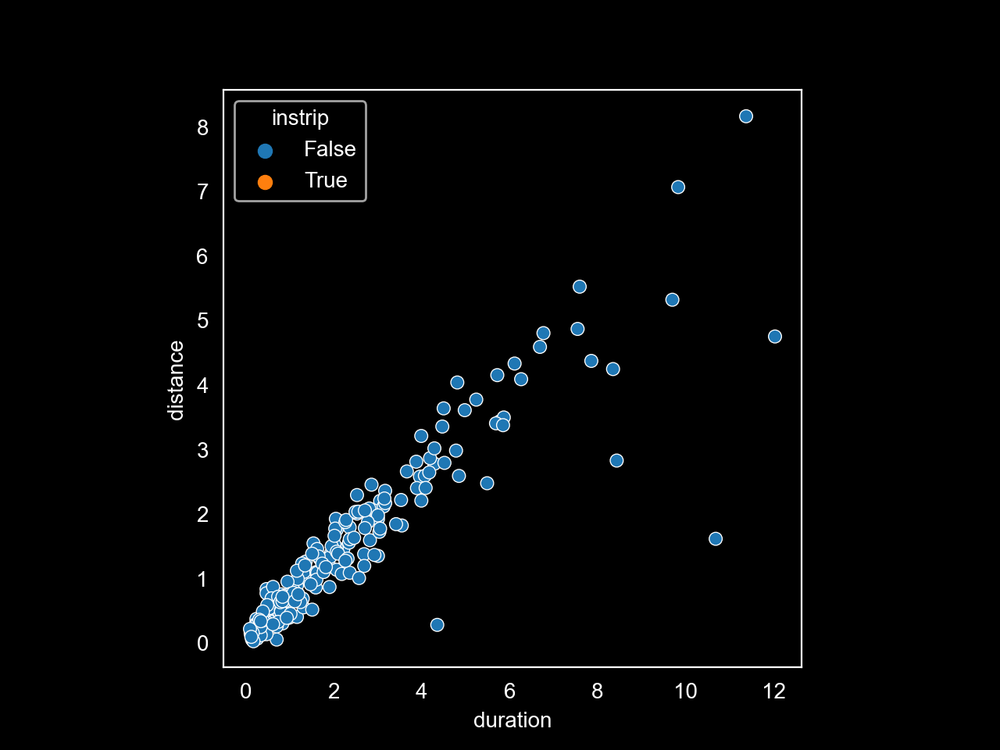

In [592]:
fig, ax = pl.subplots()
# ax=axes[0]
# sns.histplot(data=stopdurs, x='duration', ax=ax)
# ax=axes[1]
sns.scatterplot(data=stopbouts, x='duration', y='distance',hue='instrip', ax=ax)
ax.set_box_aspect(1)

In [581]:
stopdurs[stopdurs['instrip']]

,duration,instrip,distance
26,0.230264,True,0.12205


In [582]:
instrip_durs = butil.get_bout_durs(df[df['instrip']], bout_varname='boutnum')
instrip_df = pd.DataFrame(instrip_durs.items(), columns=['boutnum', 'duration'])
instrip_df['instrip'] = True
outstrip_durs = butil.get_bout_durs(df[~df['instrip']], bout_varname='boutnum')
outstrip_df = pd.DataFrame(outstrip_durs.items(), columns=['boutnum', 'duration'])
outstrip_df['instrip'] = False
bout_durs = pd.concat([instrip_df, outstrip_df])
bout_durs.index = bout_durs['boutnum'].values
bout_durs = bout_durs.sort_index() #
bout_durs.head()

,boutnum,duration,instrip
1,1,59.947213,False
2,2,14.512898,True
3,3,0.837090,False
4,4,0.575269,True
5,5,36.907160,False


In [583]:
bout_durs.tail()

,boutnum,duration,instrip
143,143,59.453651,False
144,144,0.723077,True
145,145,16.578244,False
146,146,16.597089,True
147,147,7.427750,False


In [584]:
# N stops per bout
bout_durs['nstops']=None
for b, df_ in df.groupby(['boutnum']):
    nstops = len(df_[df_['stopped']]['stopbout'].unique())
    bout_durs.loc[b, 'nstops'] = nstops
bout_durs.groupby(['instrip'])['nstops'].sum()

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_65952/623532738.py:3: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for b, df_ in df.groupby(['boutnum']):


instrip
False    224
True       2
Name: nstops, dtype: object

<IPython.core.display.Javascript object>


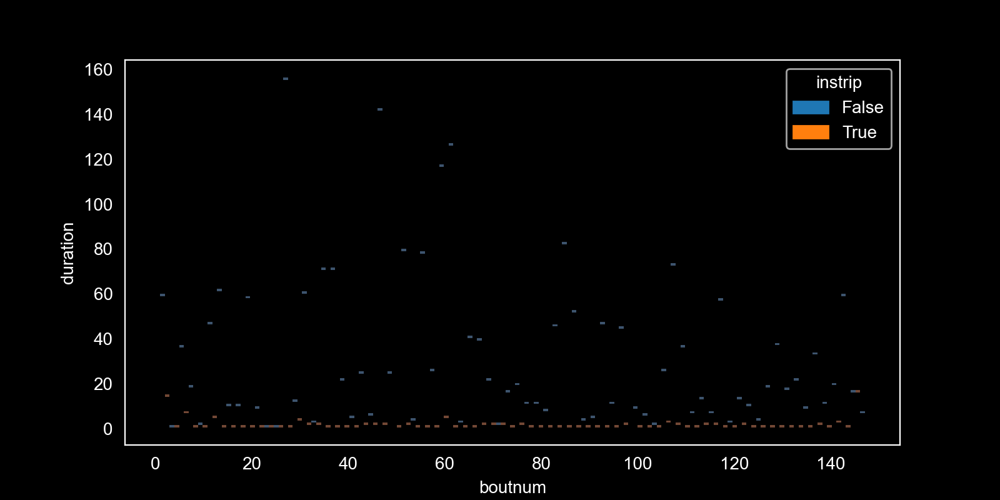

<AxesSubplot: xlabel='boutnum', ylabel='duration'>

In [585]:
fig, ax = pl.subplots(figsize=(8,4)) #figsize=(10,4))
sns.histplot(data=bout_durs, x='boutnum', y='duration', hue='instrip', #palette='cool',
              alpha=1, ax=ax, #='none', 
             bins=len(bout_durs)+2)

<IPython.core.display.Javascript object>


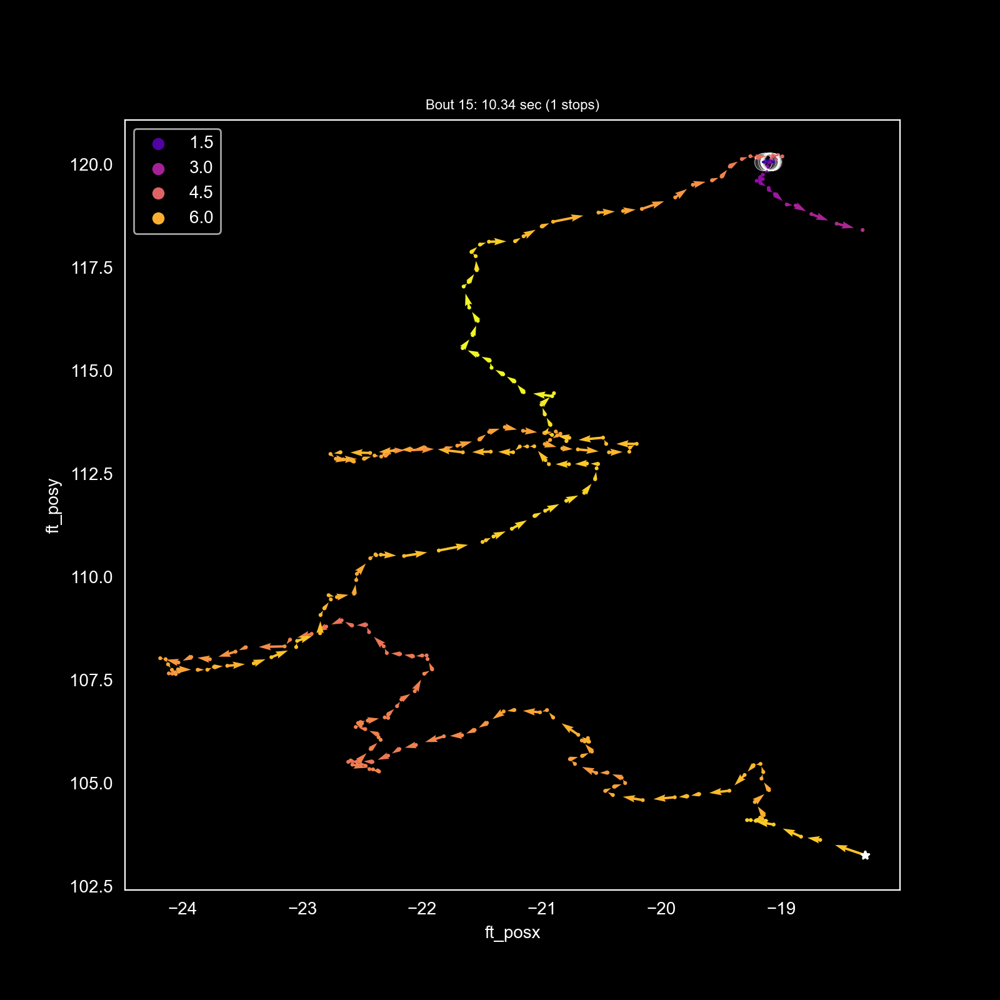

In [601]:
hue_param = 'smoothed_speed'
boutnum = 15
df_ = df.groupby(['boutnum']).get_group(boutnum)

# how many stops
#df_['stop_bout'] = (df_["stopped"] != df_["stopped"].shift()).cumsum()
nstops = len(df_[df_['stopped']==True]['stopbout'].unique())
    
colors=df_[hue_param]
norm = mpl.colors.Normalize()
norm.autoscale(colors)
colormap = mpl.cm.plasma
sm = mpl.cm.ScalarMappable(cmap='plasma', norm=norm)
sm.set_array([])

fig, ax  = pl.subplots(figsize=(8,8))
ax.set_title('Bout {}: {:.2f} sec ({} stops)'.format(boutnum, boutdurs[boutnum], nstops), fontsize=8)

# Plot points
sns.scatterplot(data=df_, x='ft_posx', y='ft_posy', hue=hue_param, 
               palette='plasma', ax=ax, s=5, edgecolor='none')
# Plot stop point(s)
sns.scatterplot(data=df_[df_['stopped']], x='ft_posx', y='ft_posy', color='white', 
                marker='o', ax=ax, s=100, edgecolor='white', linewidth=.1, facecolor='none')
# The arrow shape is determined by *width*, *headwidth*, *headlength* \
# and *headaxislength*. See the notes below.
# angles : {'uv', 'xy'} or array-like, default: 'uv' 
#     - 'xy': Arrow direction in data coordinates, i.e. the arrows point from
#      (x, y) to (x+u, y+v). Use this e.g. for plotting a gradient field.
# If *scale_units* is 'x' then the vector will be 0.5 x-axis units. \
# To plot vectors in the x-y plane, with u and v having the same units as x and y, use
# ``angles='xy', scale_units='xy', scale=1``.
#u = df_['ft_posx'].shift().values
#v = df_['ft_posy'].shift().values
uu = df_['ft_posx'].shift(periods=-1) - df_['ft_posx']
vv = df_['ft_posy'].shift(periods=-1) - df_['ft_posy']
ax.quiver(df_['ft_posx'].values, df_['ft_posy'].values, uu, vv, color=colormap(norm(colors)), 
          angles='xy', scale_units='xy', scale=1.5)
#ax.axvline(x=odor_xmin, color='w')
# Plot starting point
ax.plot(df_.iloc[0]['ft_posx'], df_.iloc[0]['ft_posy'], color='white', 
                marker='*', markersize=5)
# Colorbar
#ax.figure.colorbar(sm)


## plot all outbouts

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_65952/3470395151.py:15: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for boutnum, df_ in plotdf[~plotdf['instrip']].groupby(['boutnum']):


<IPython.core.display.Javascript object>


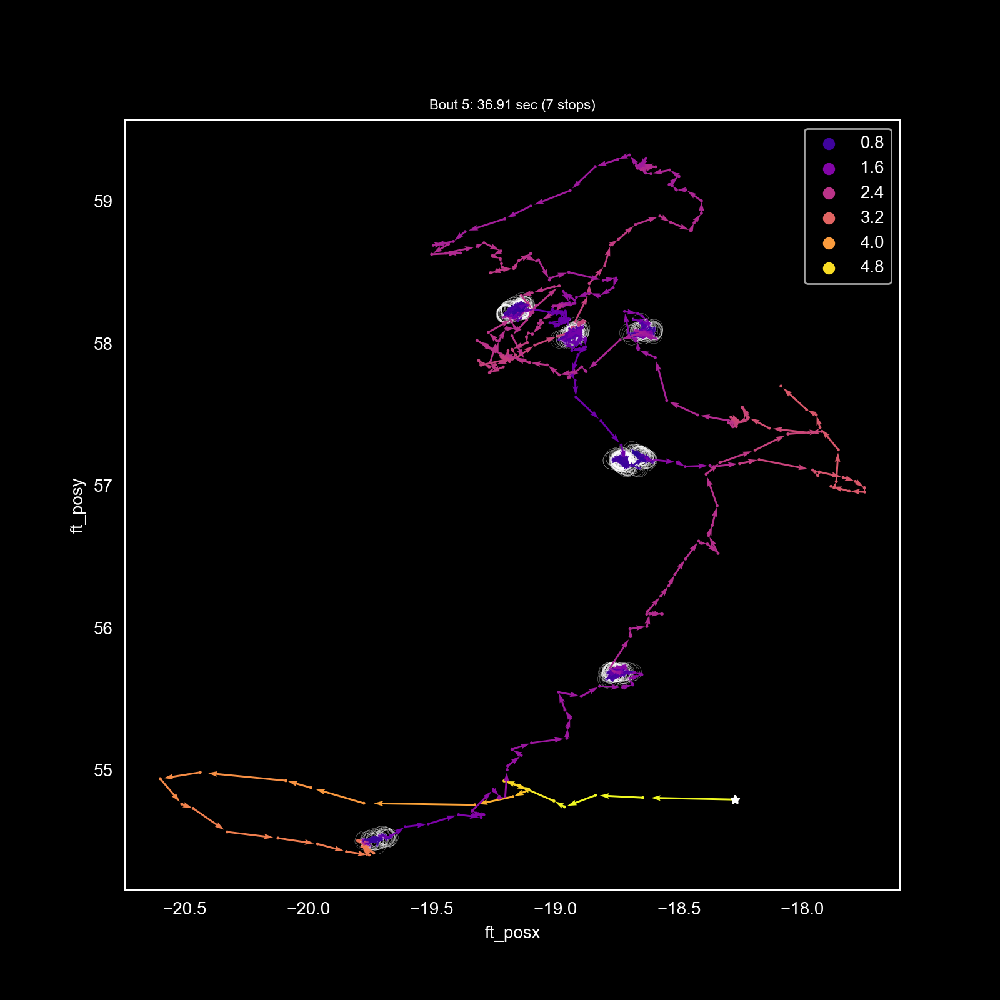

<IPython.core.display.Javascript object>


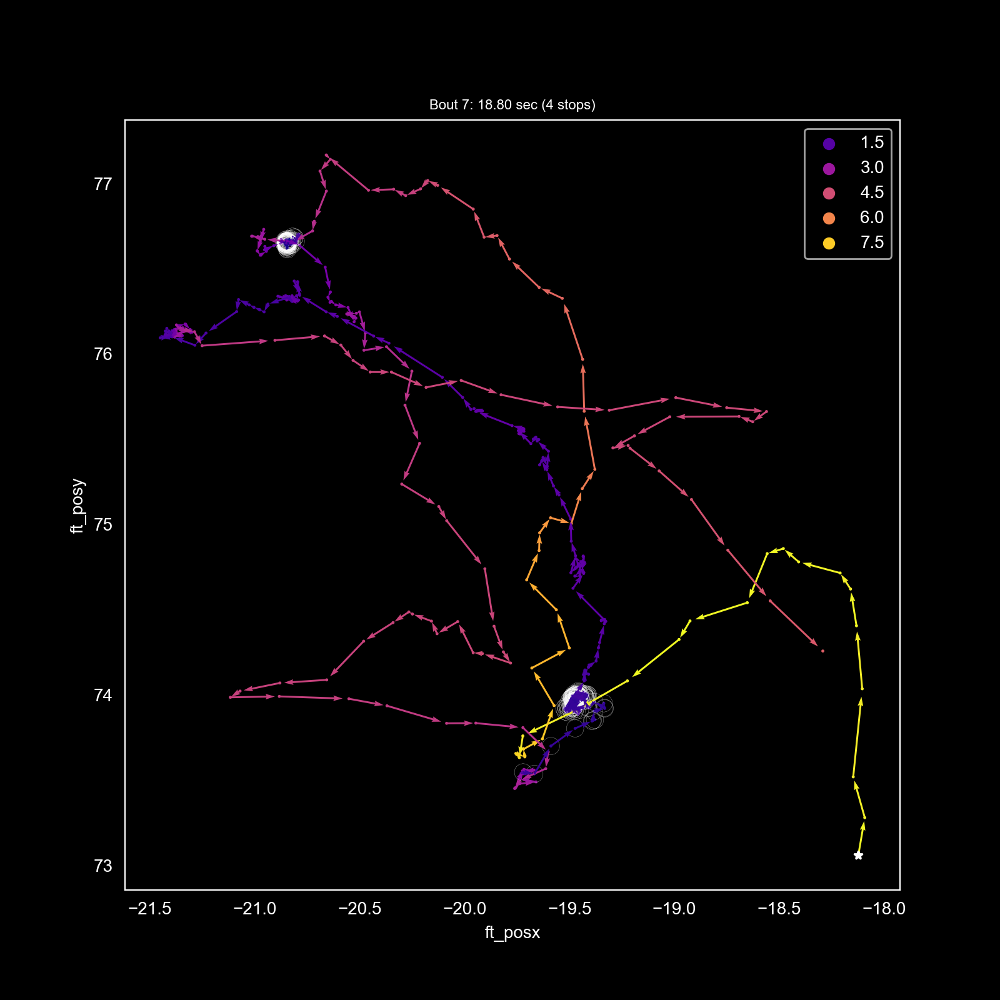

<IPython.core.display.Javascript object>


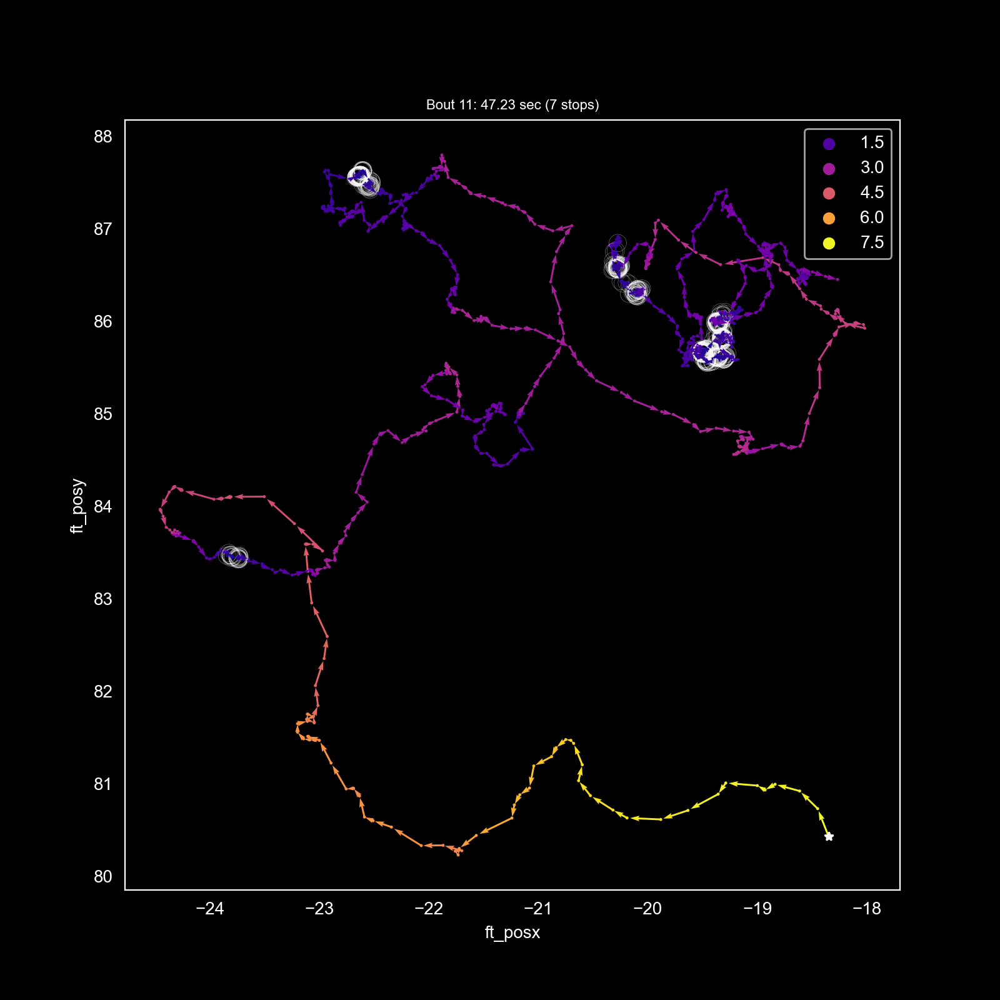

<IPython.core.display.Javascript object>


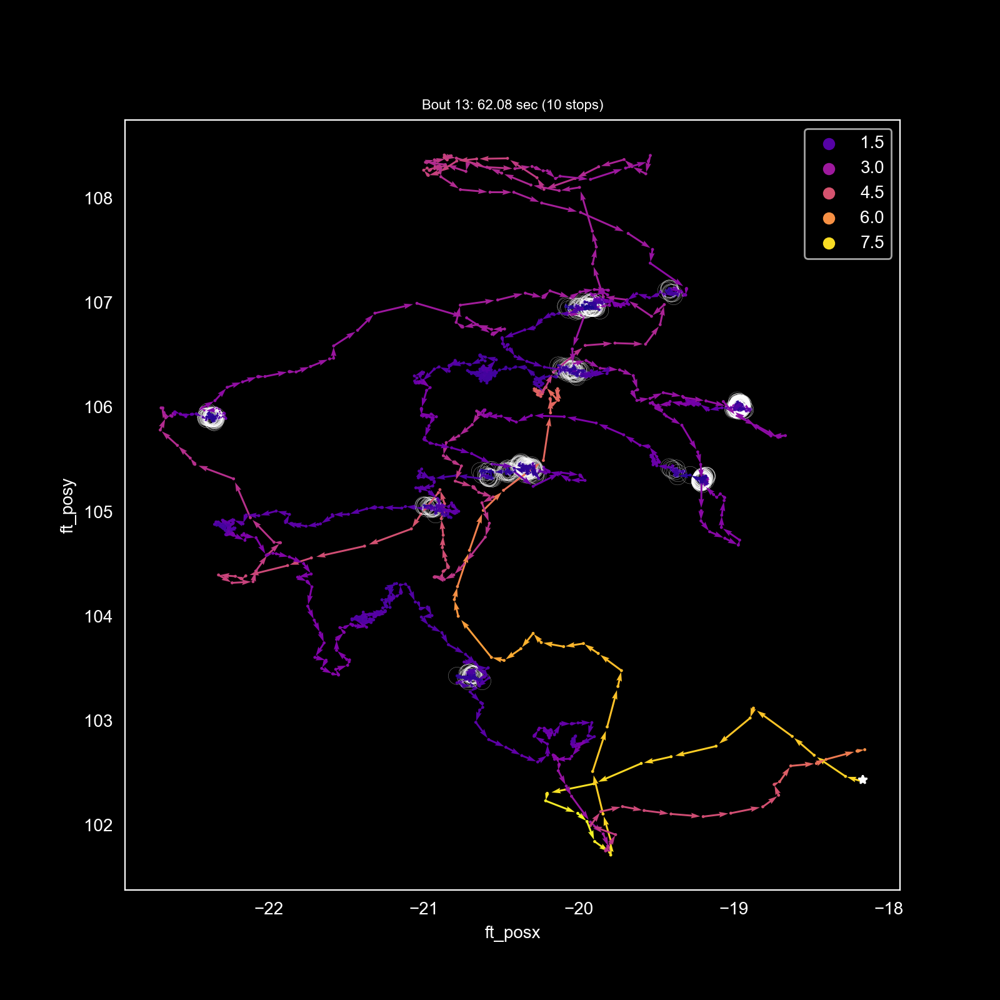

<IPython.core.display.Javascript object>


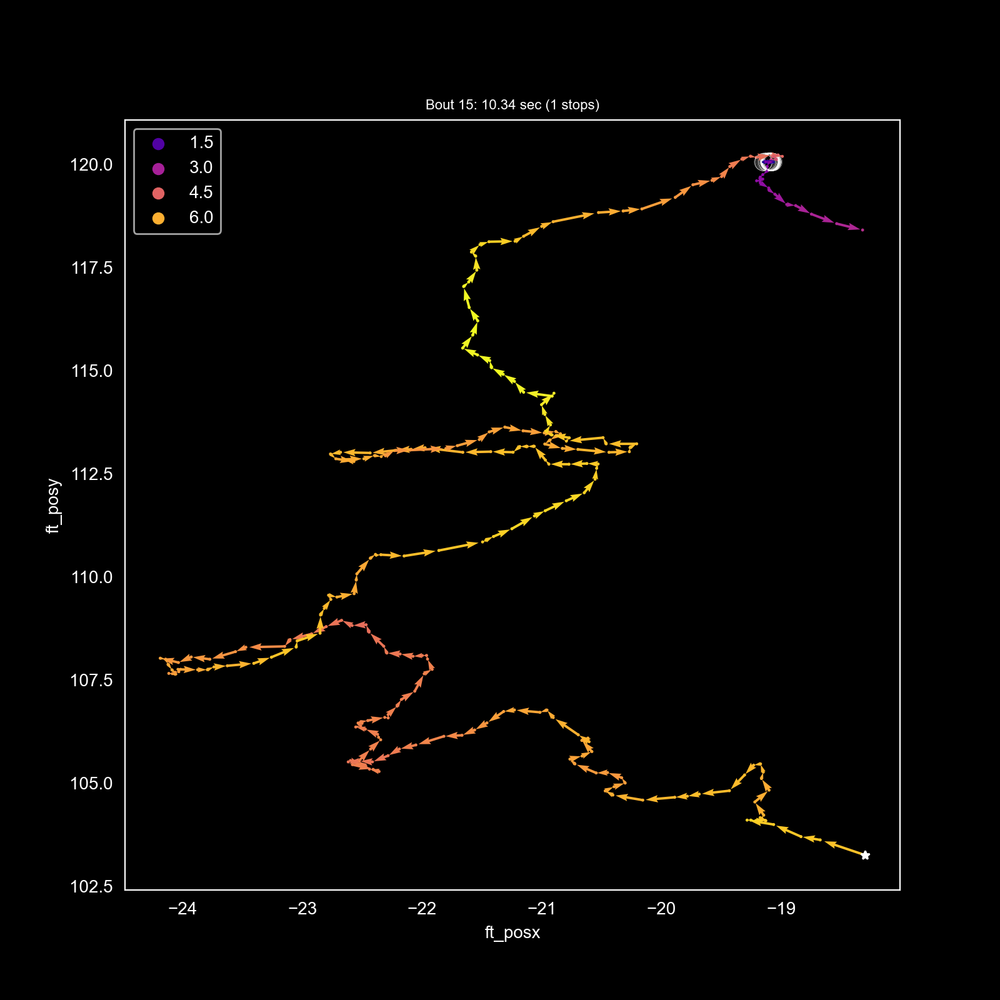

<IPython.core.display.Javascript object>


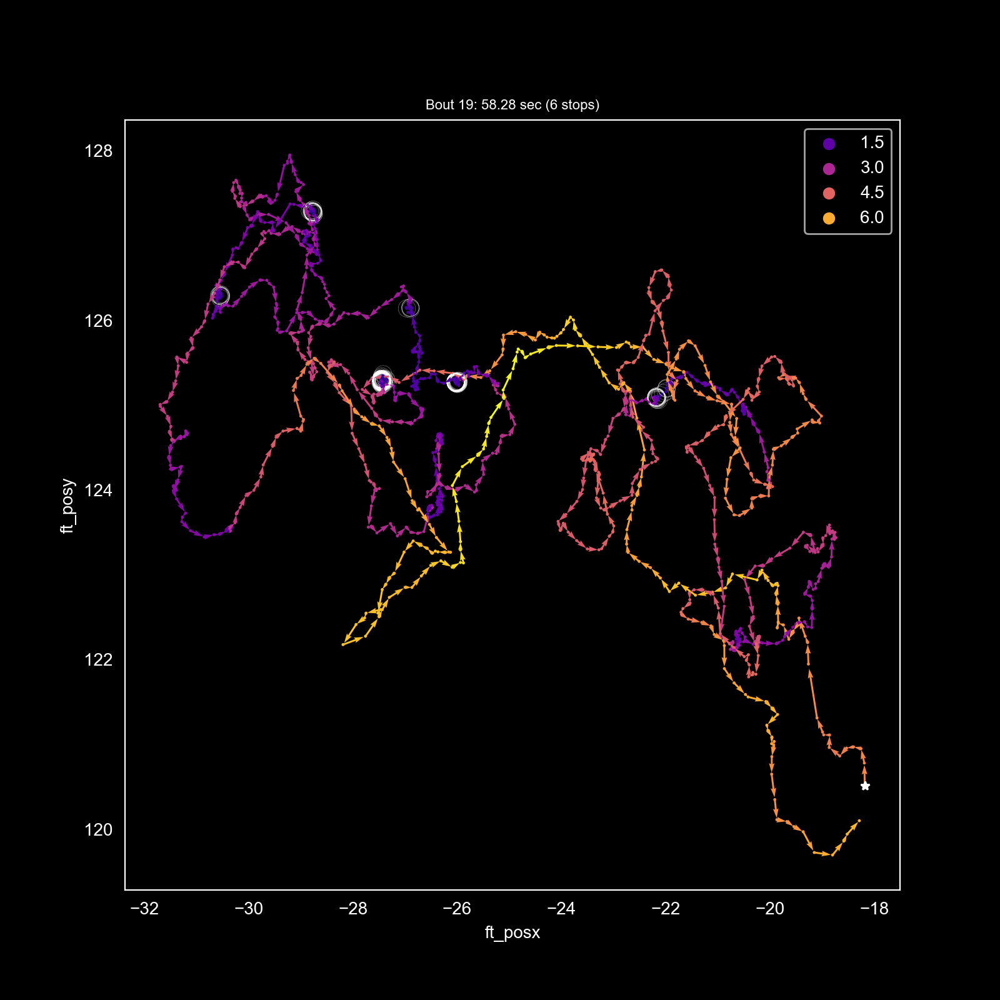

<IPython.core.display.Javascript object>


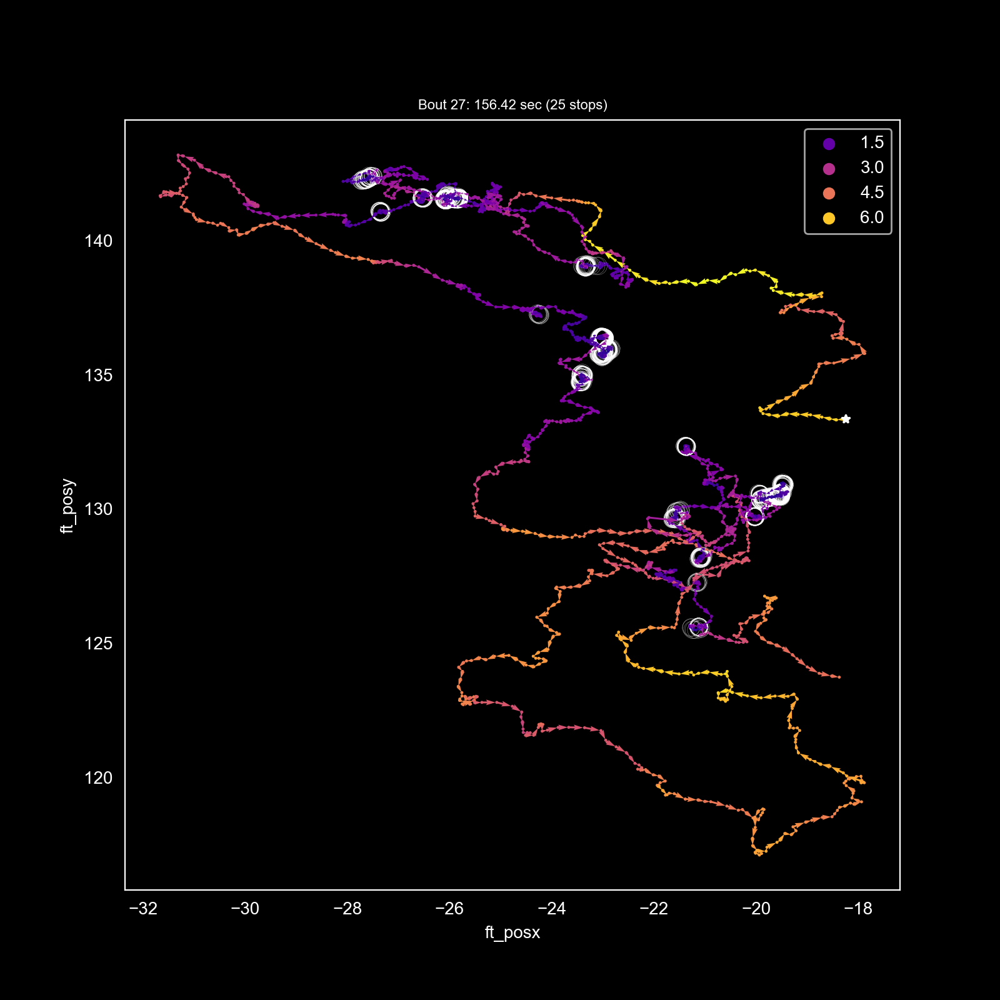

<IPython.core.display.Javascript object>


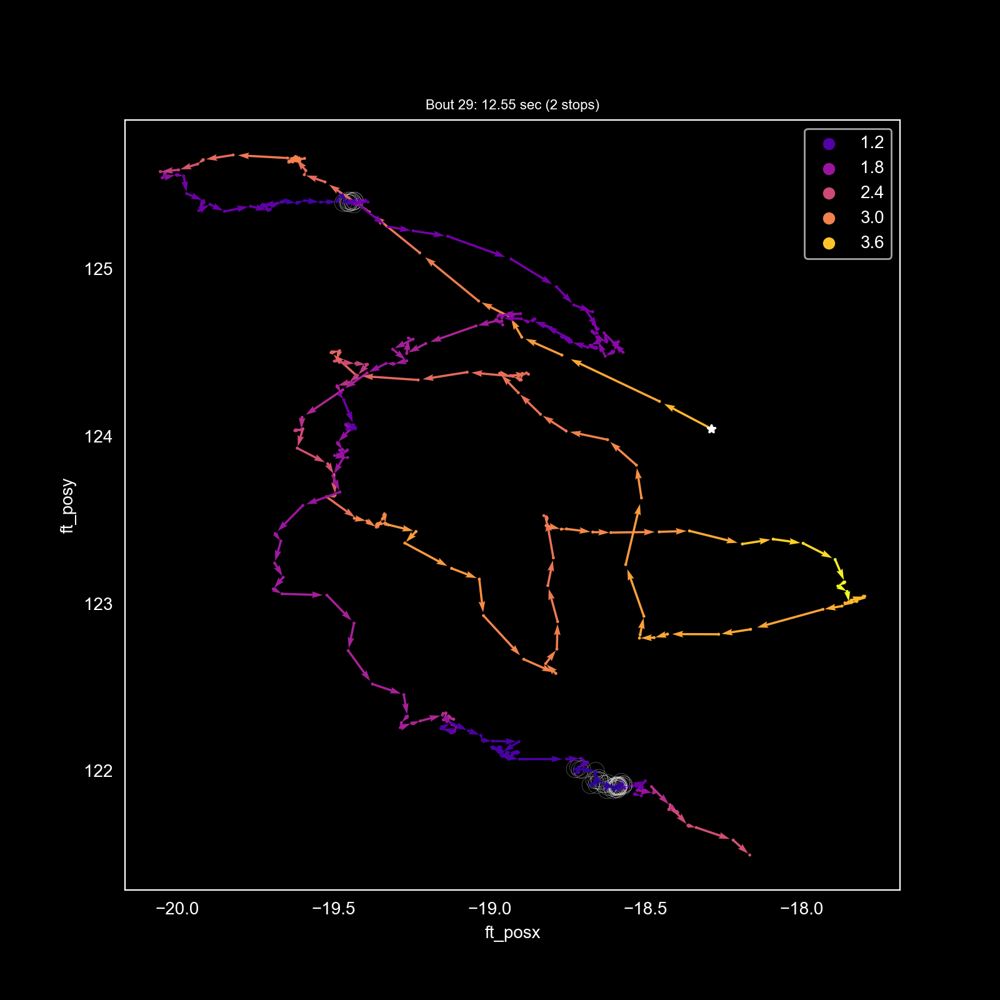

<IPython.core.display.Javascript object>


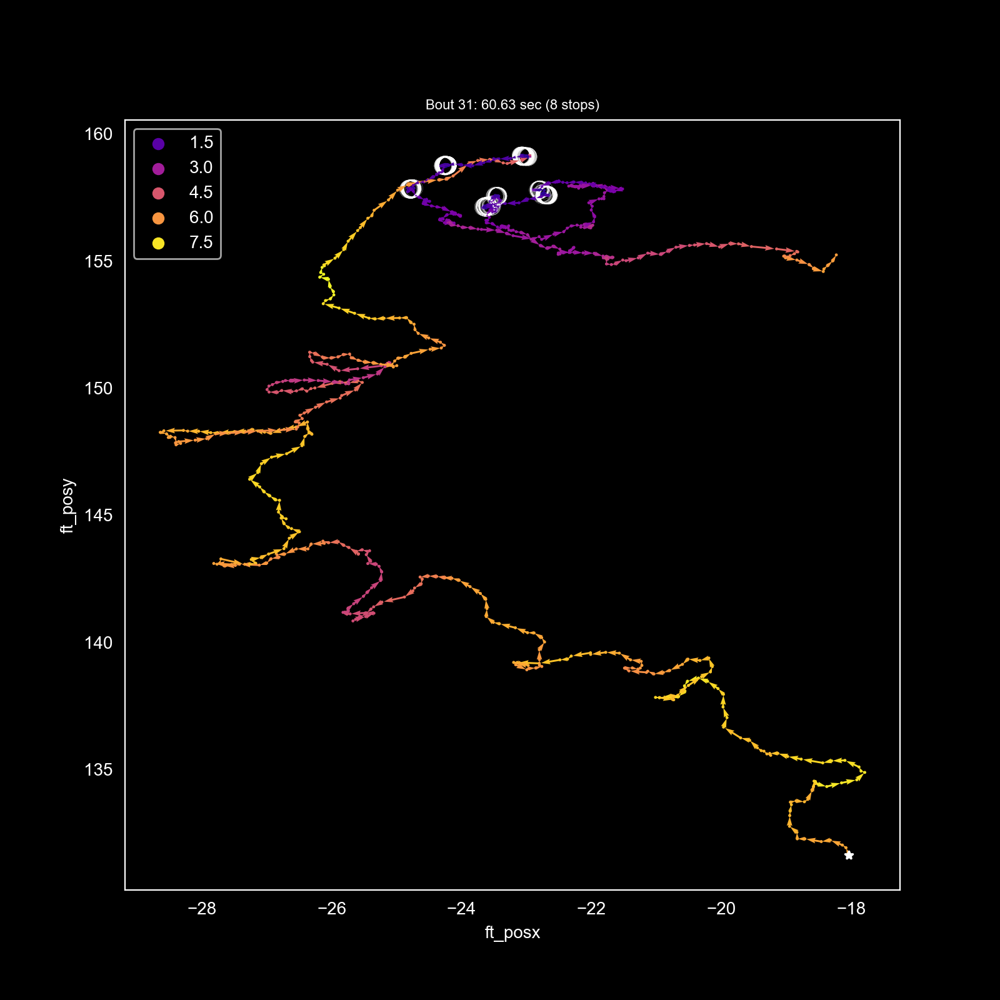

<IPython.core.display.Javascript object>


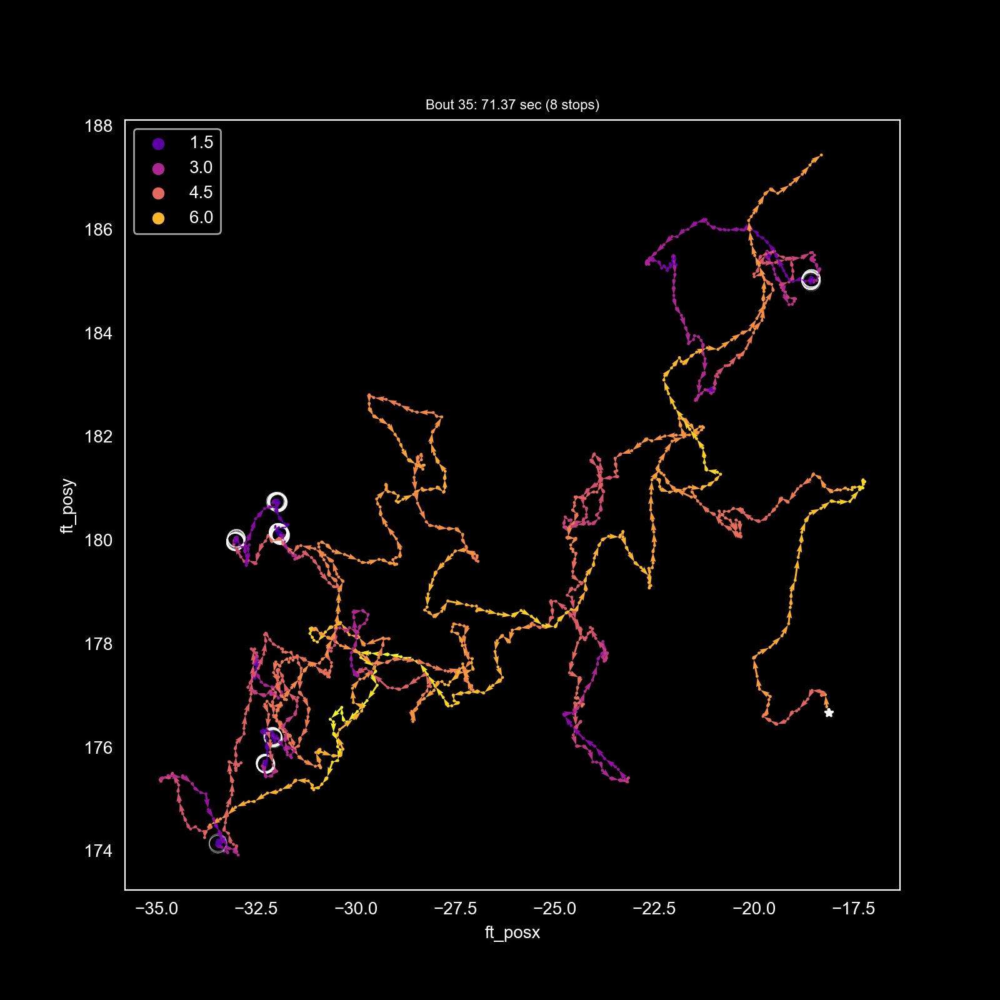

<IPython.core.display.Javascript object>


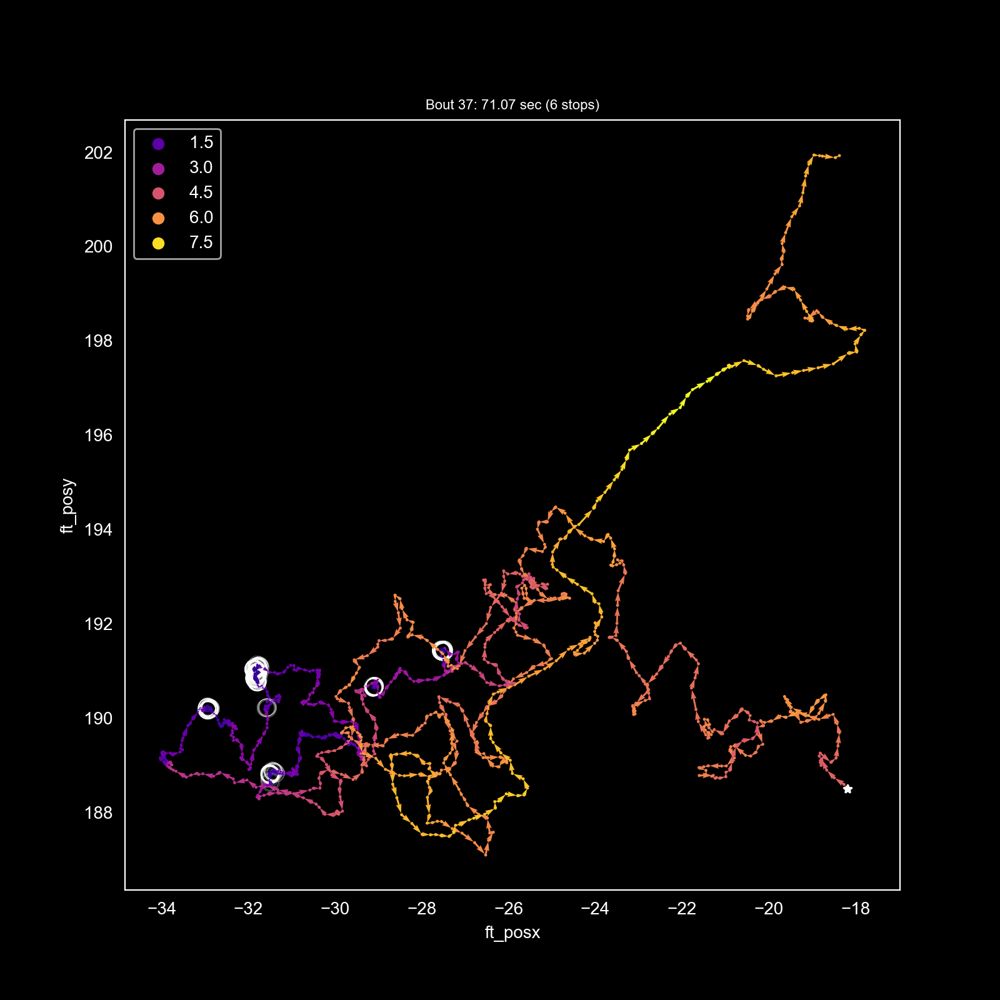

<IPython.core.display.Javascript object>


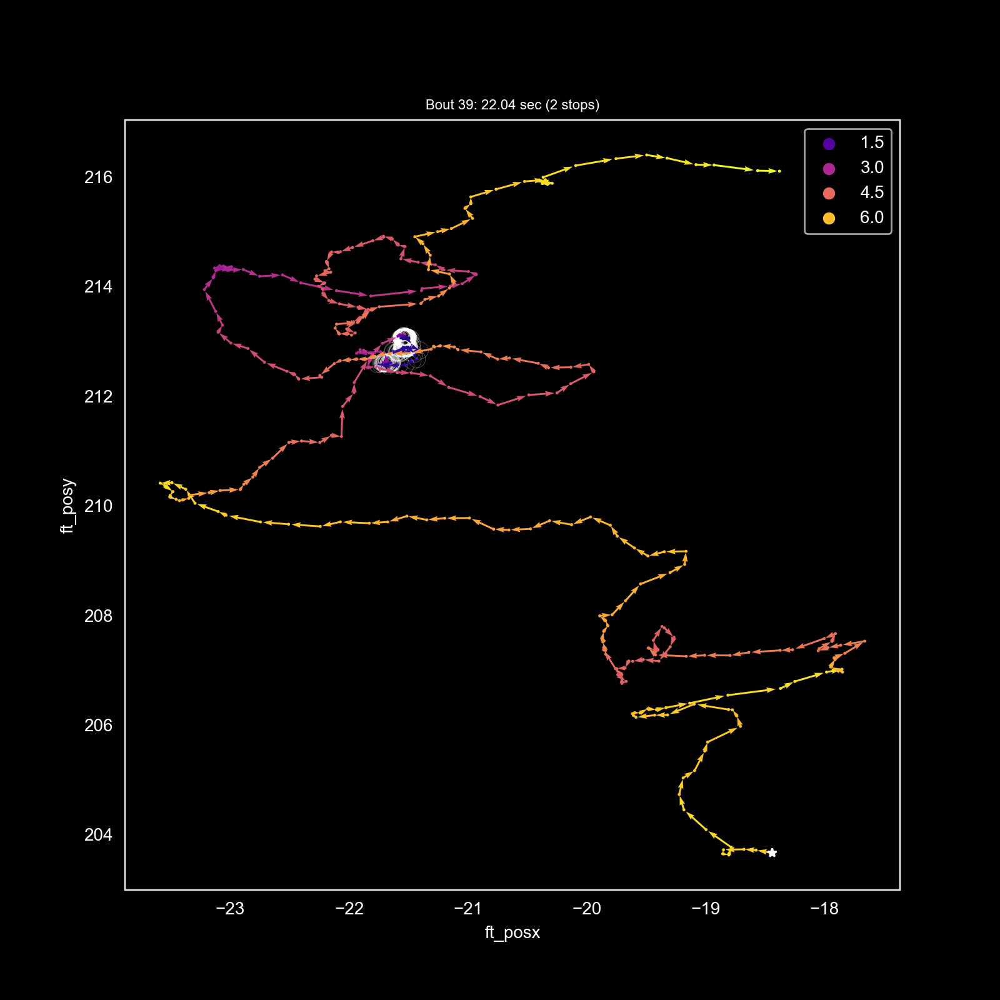

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_65952/3470395151.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax  = pl.subplots(figsize=(8,8))


<IPython.core.display.Javascript object>


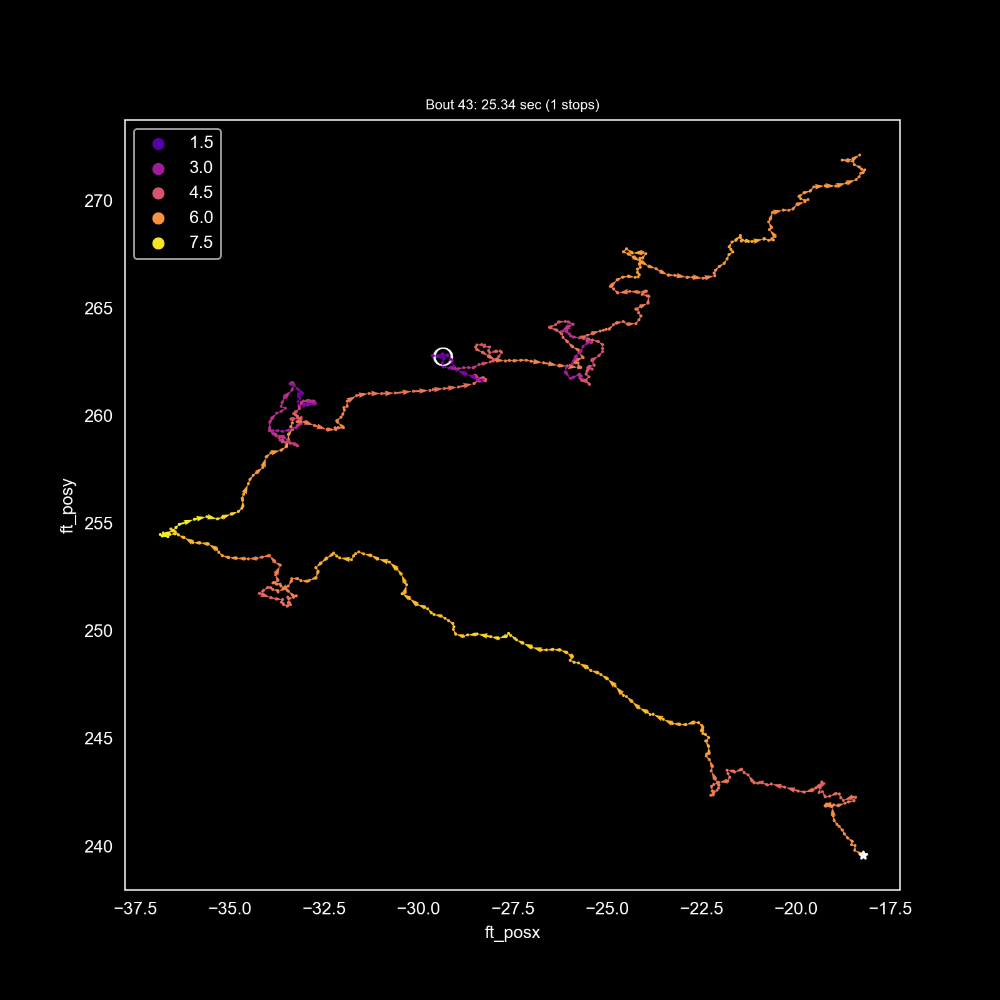

<IPython.core.display.Javascript object>


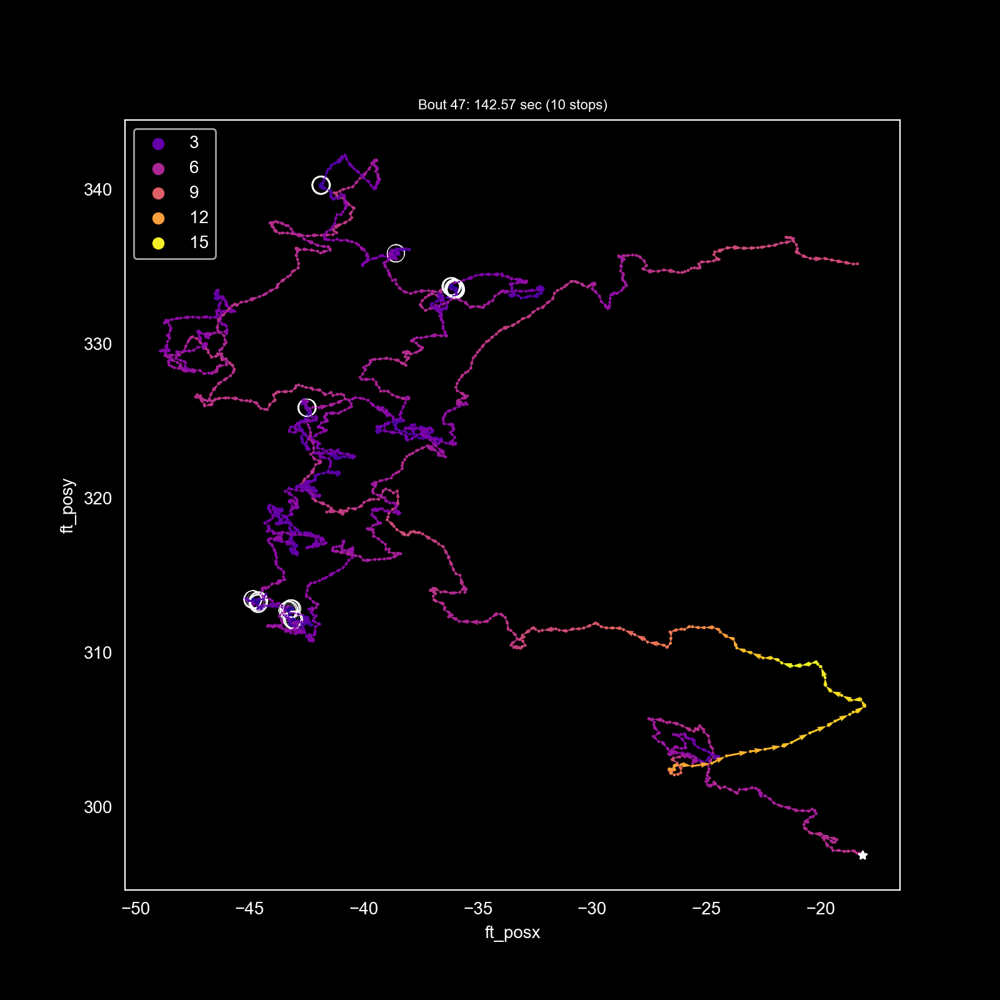

<IPython.core.display.Javascript object>


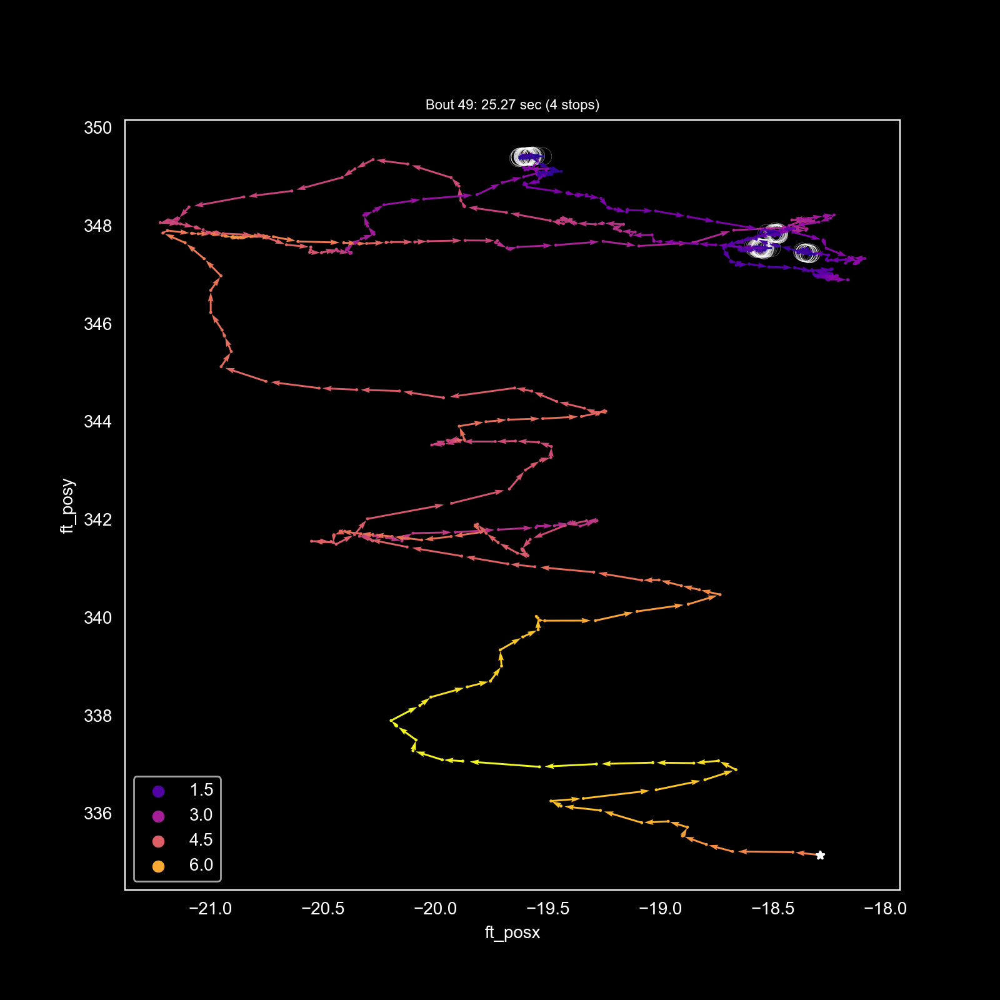

<IPython.core.display.Javascript object>


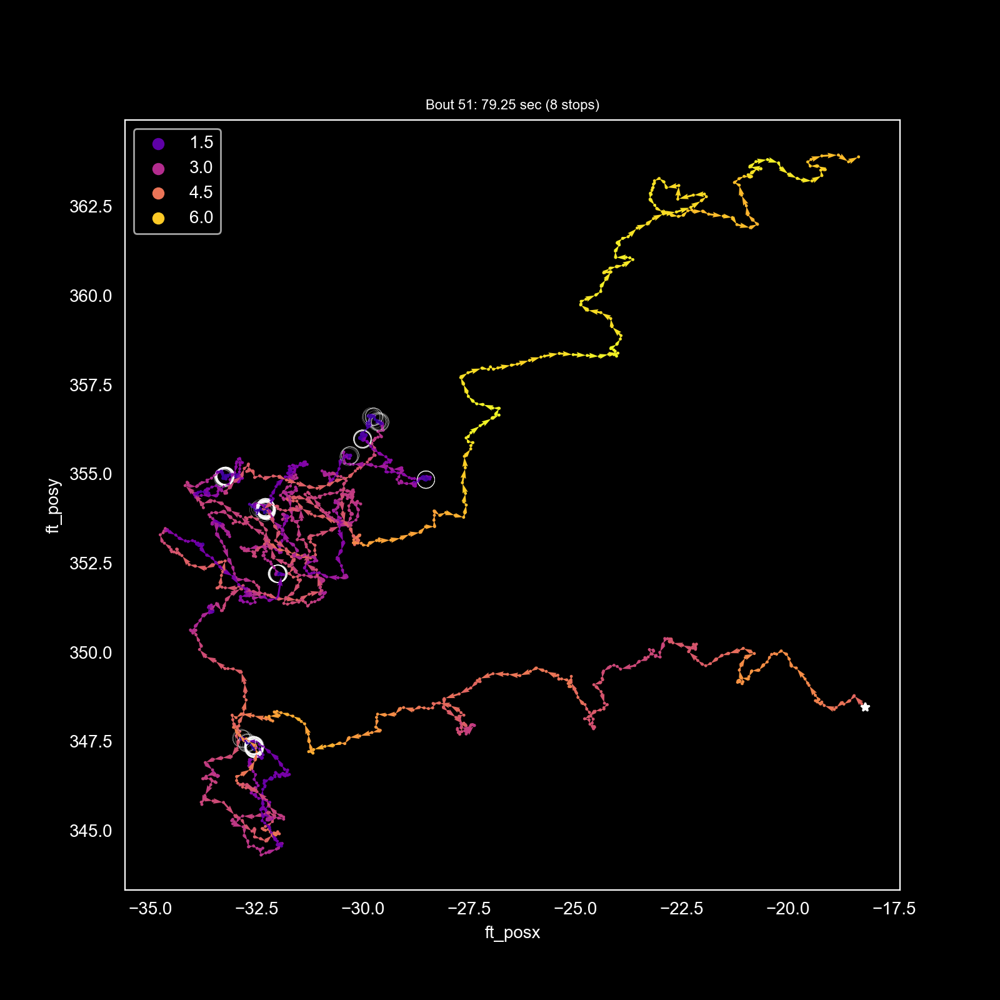

<IPython.core.display.Javascript object>


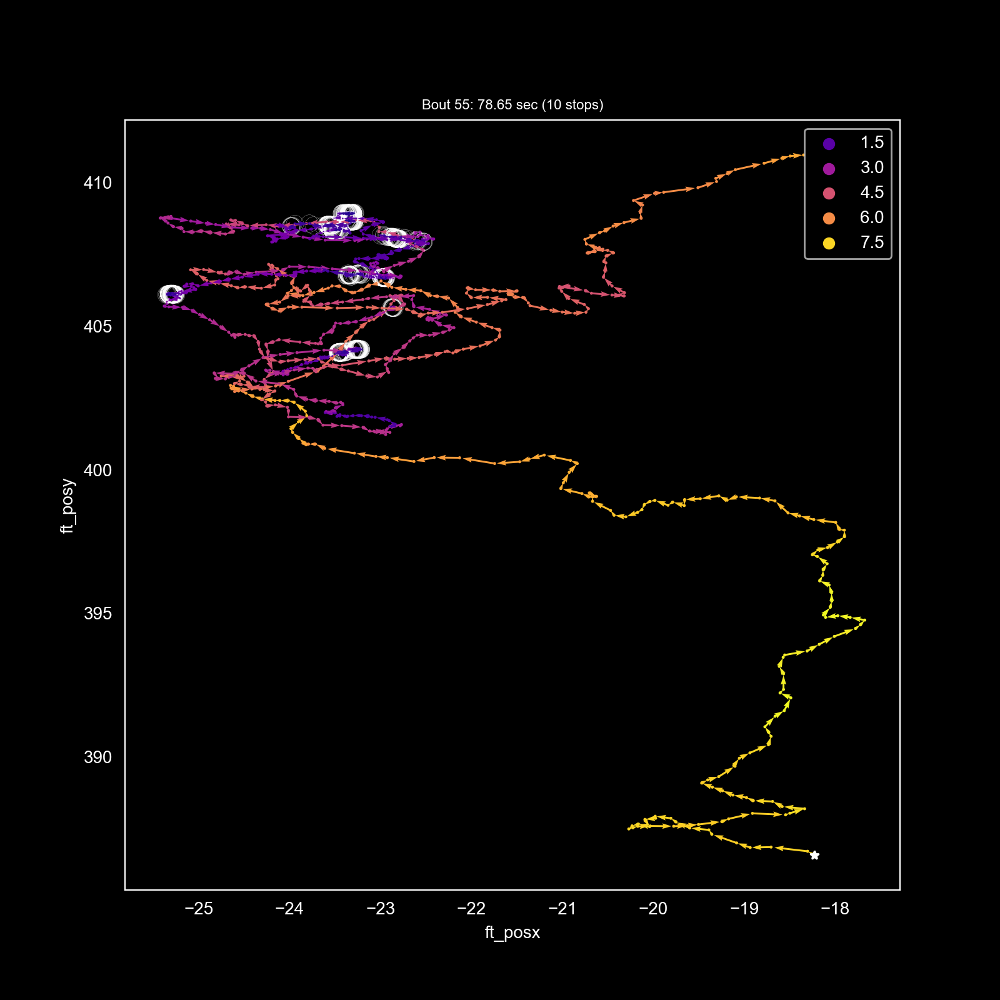

<IPython.core.display.Javascript object>


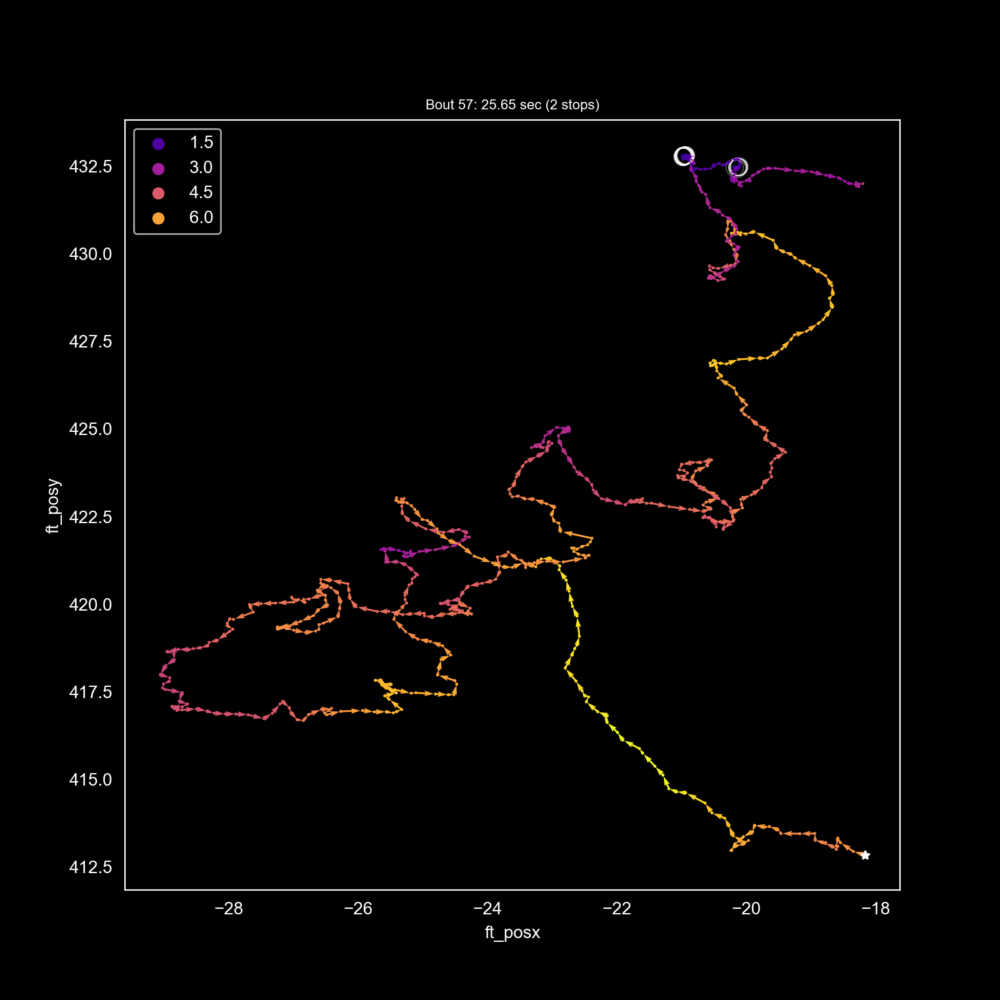

<IPython.core.display.Javascript object>


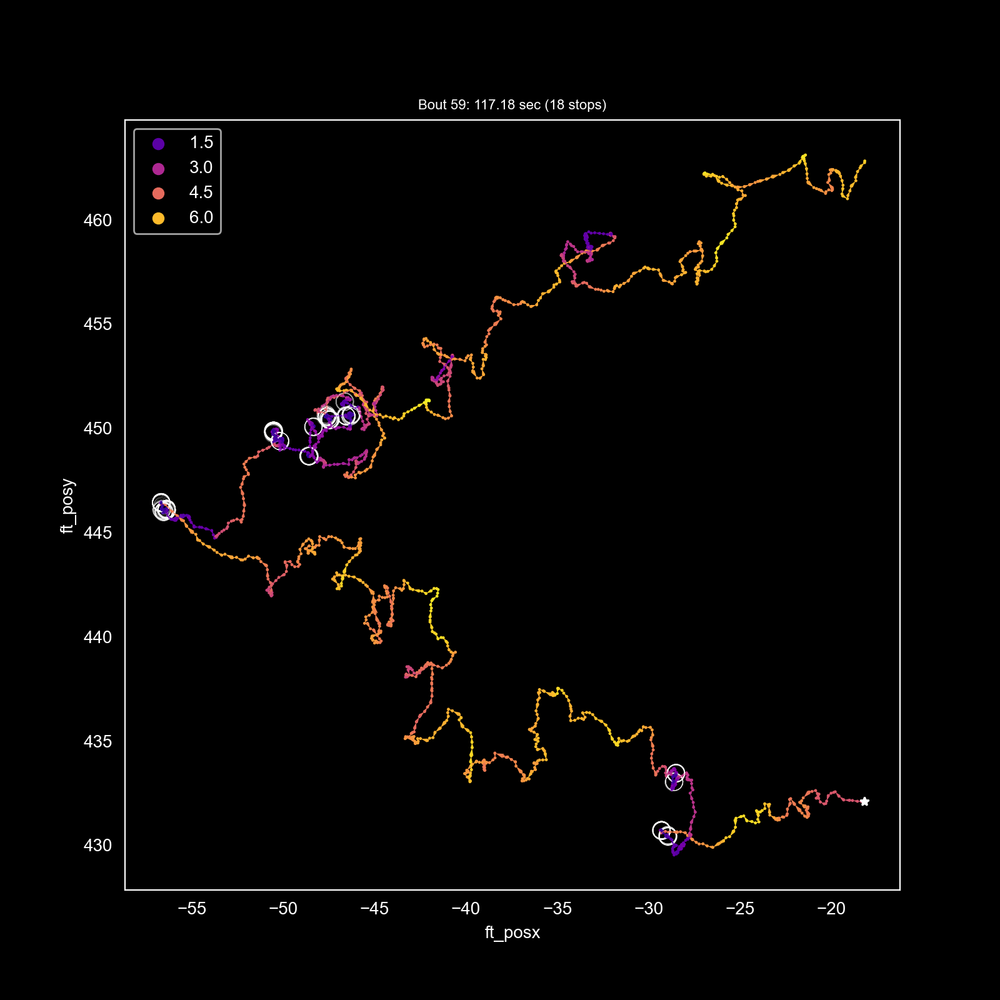

<IPython.core.display.Javascript object>


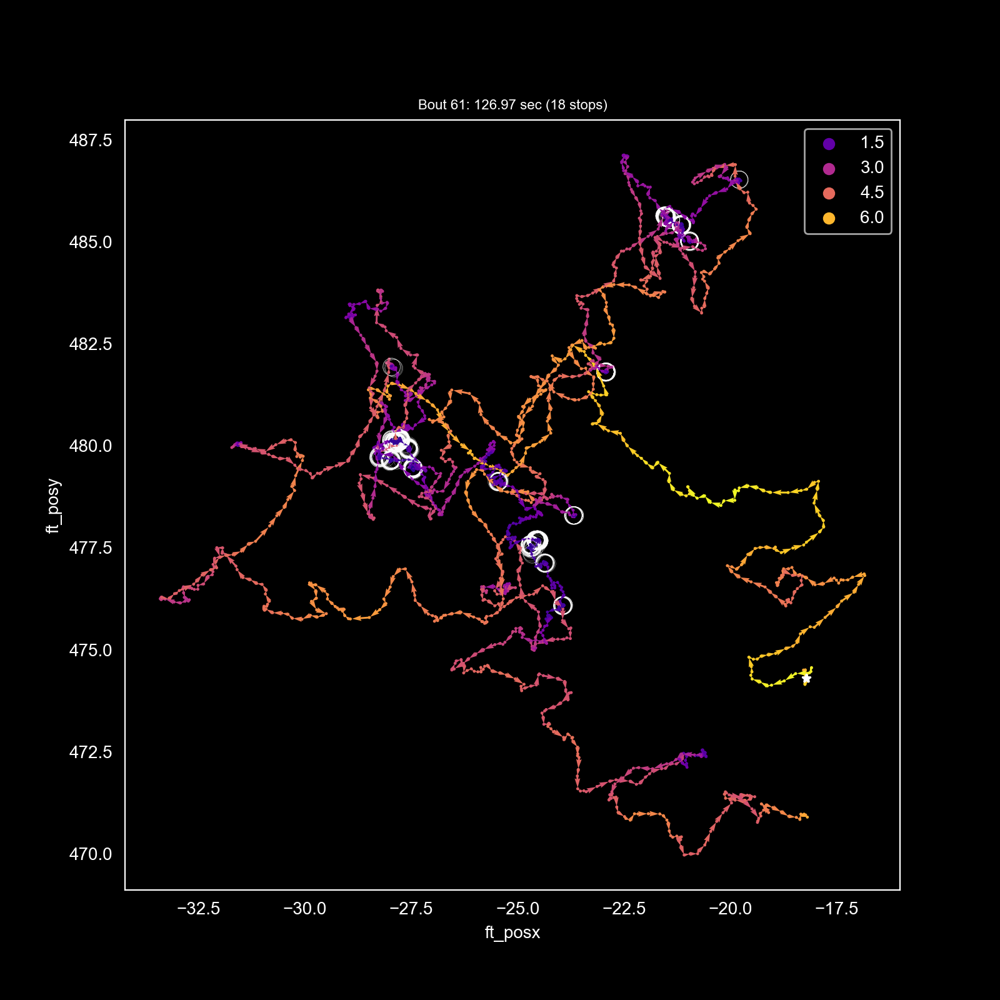

<IPython.core.display.Javascript object>


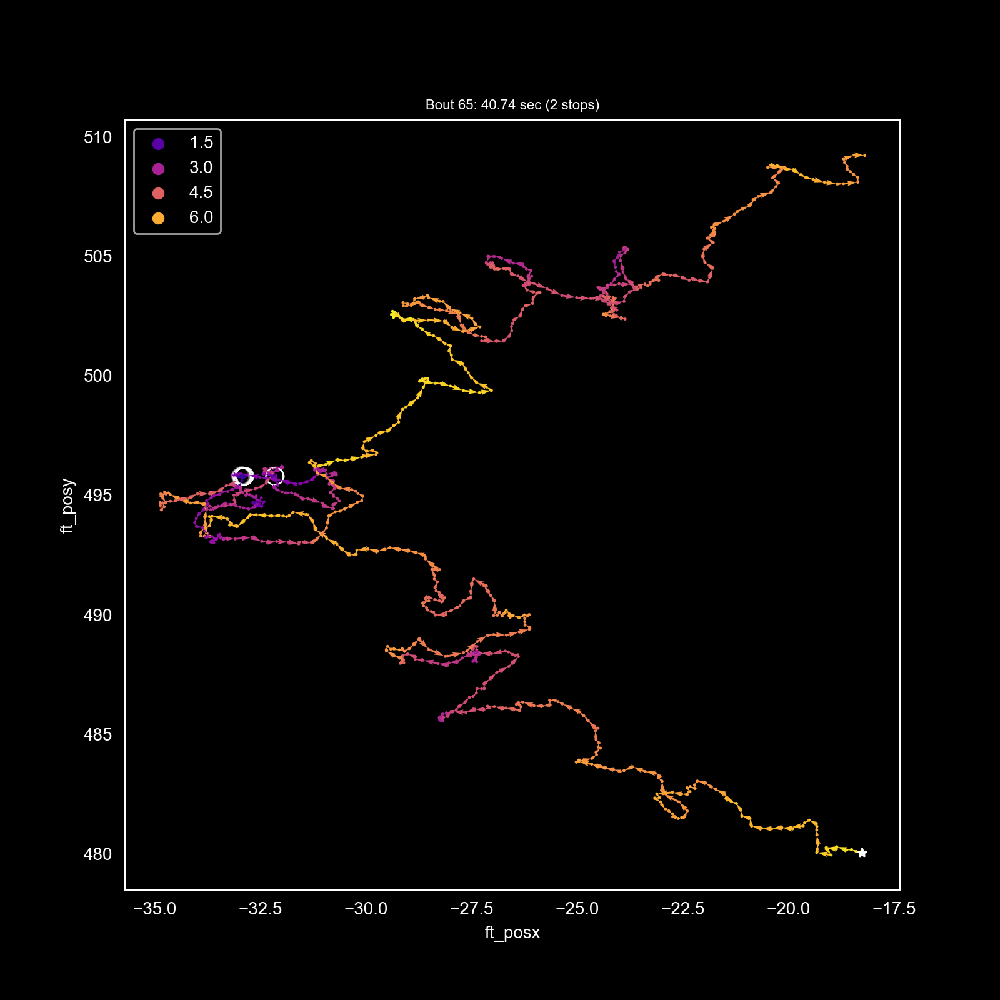

<IPython.core.display.Javascript object>


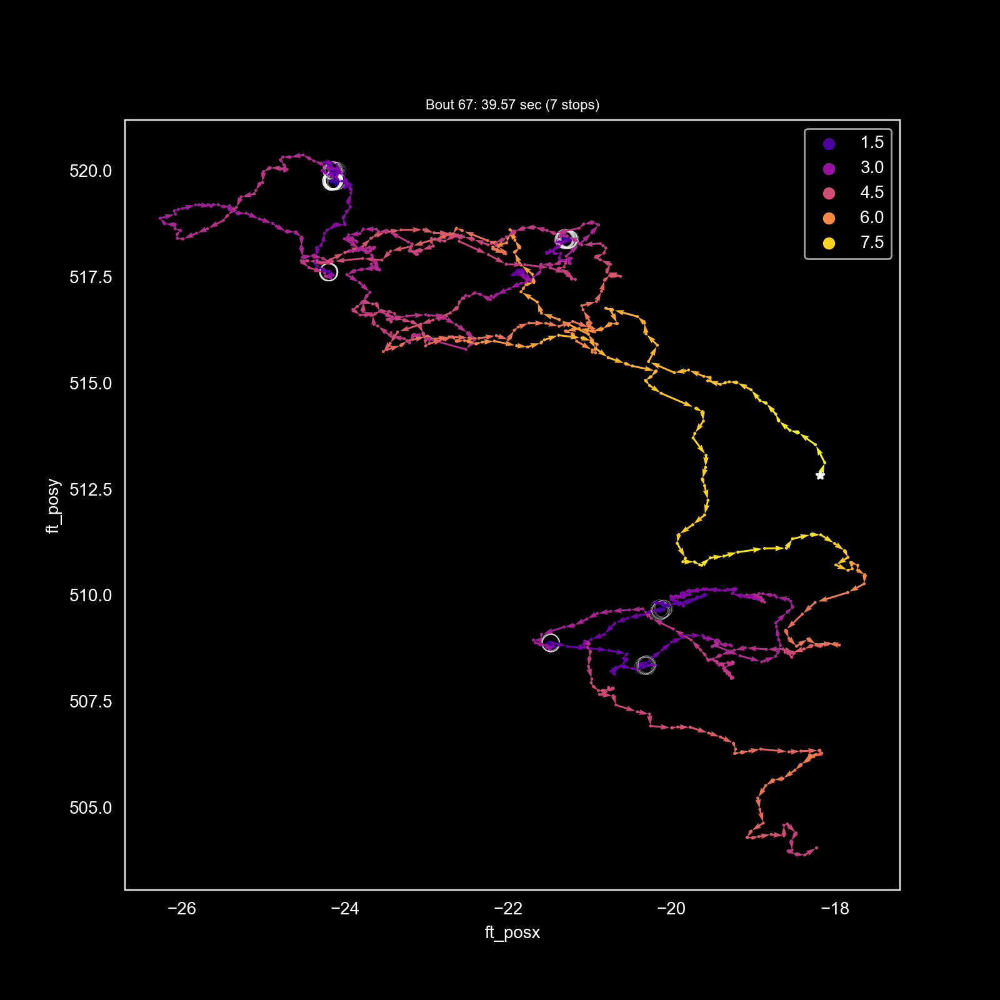

<IPython.core.display.Javascript object>


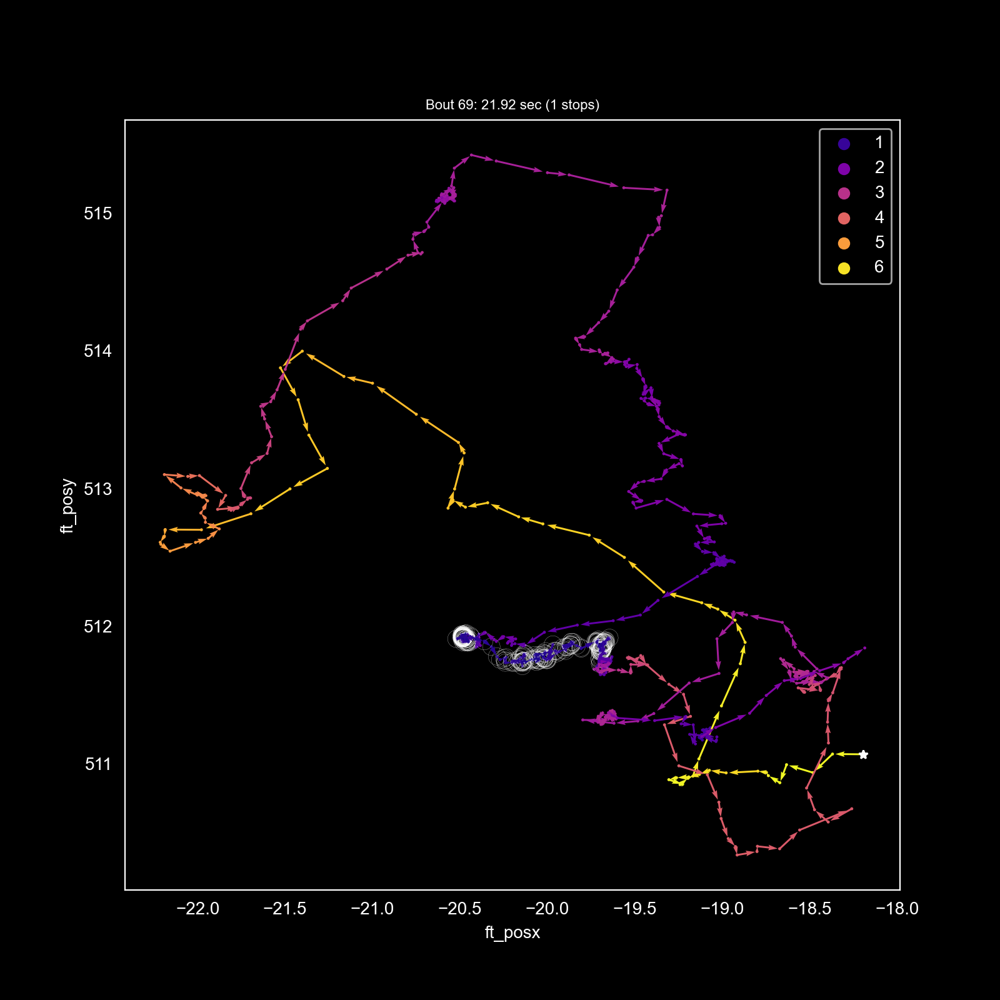

<IPython.core.display.Javascript object>


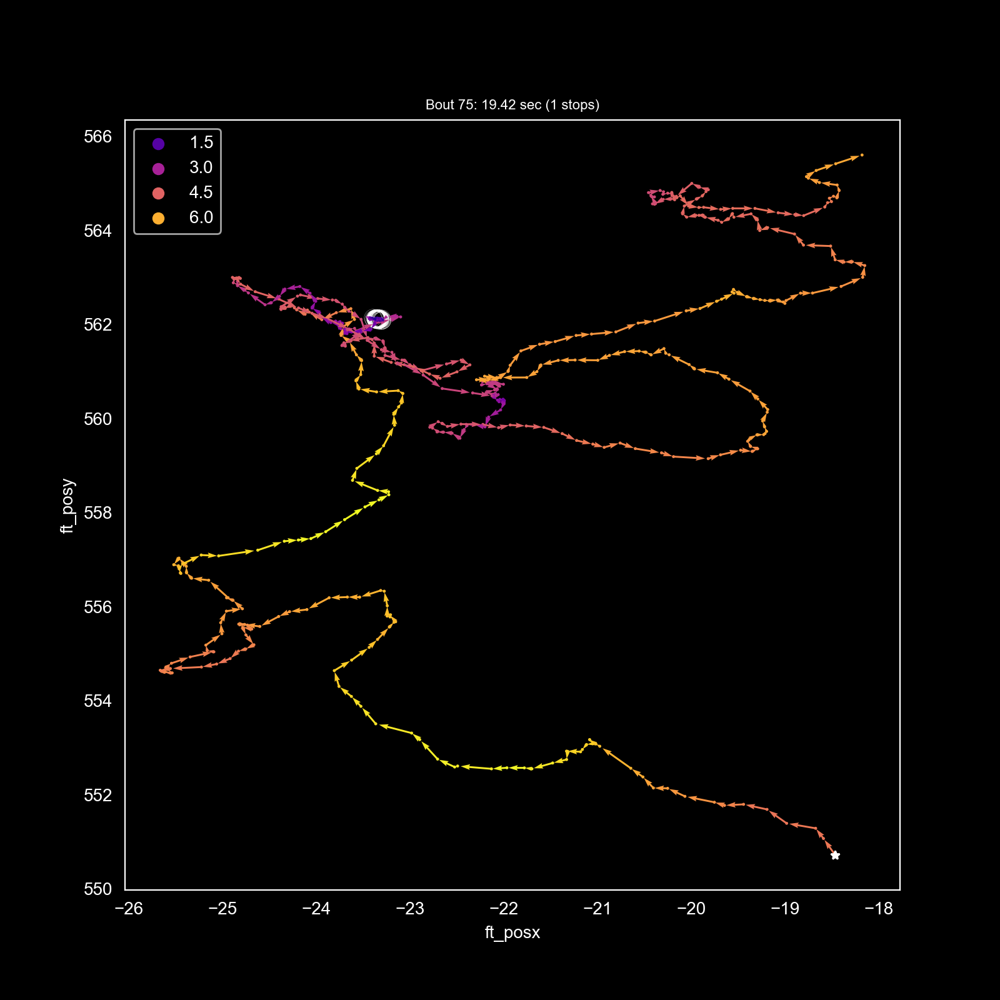

<IPython.core.display.Javascript object>


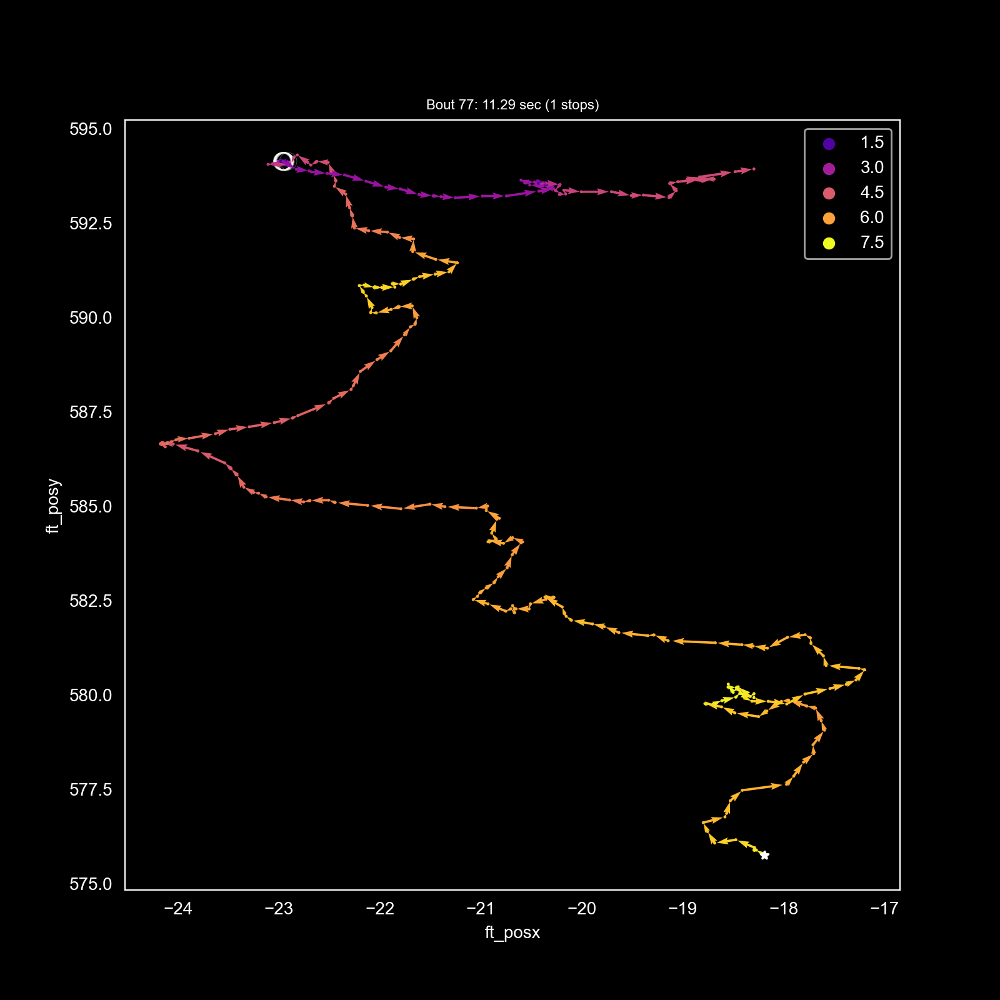

<IPython.core.display.Javascript object>


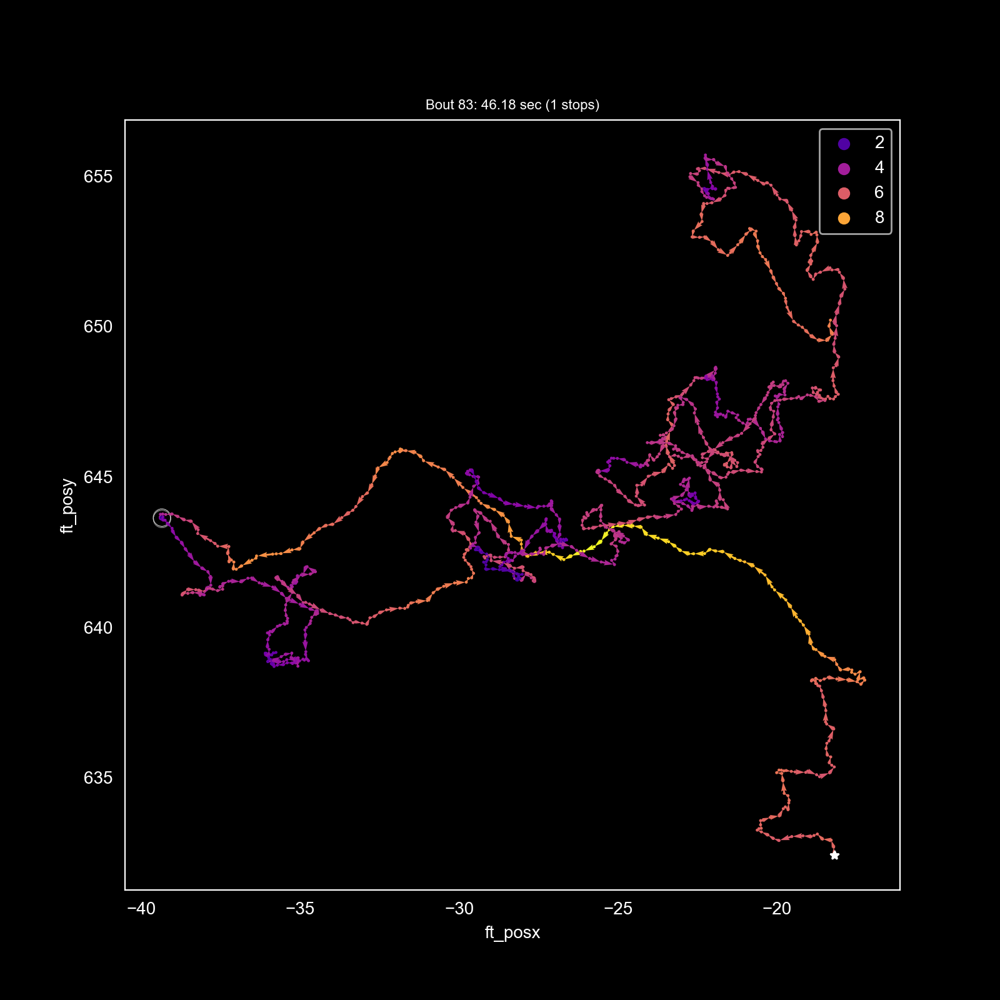

<IPython.core.display.Javascript object>


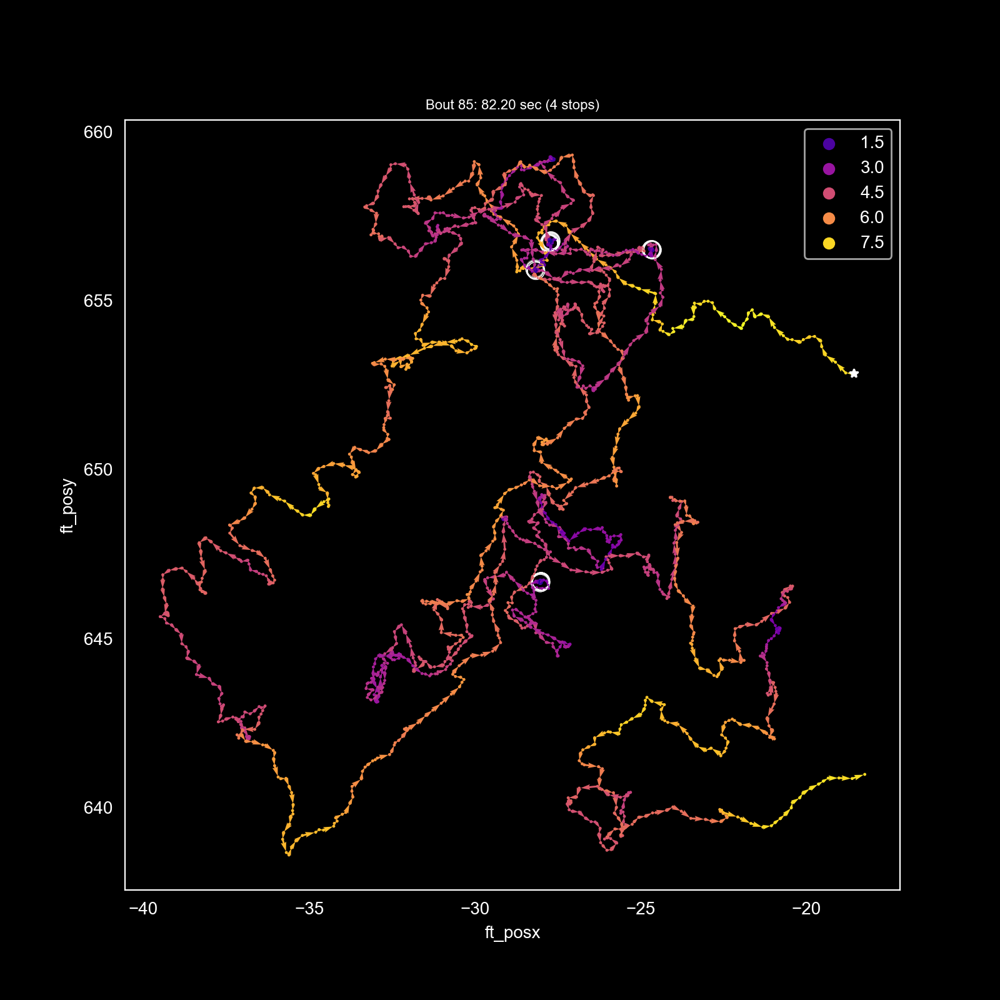

<IPython.core.display.Javascript object>


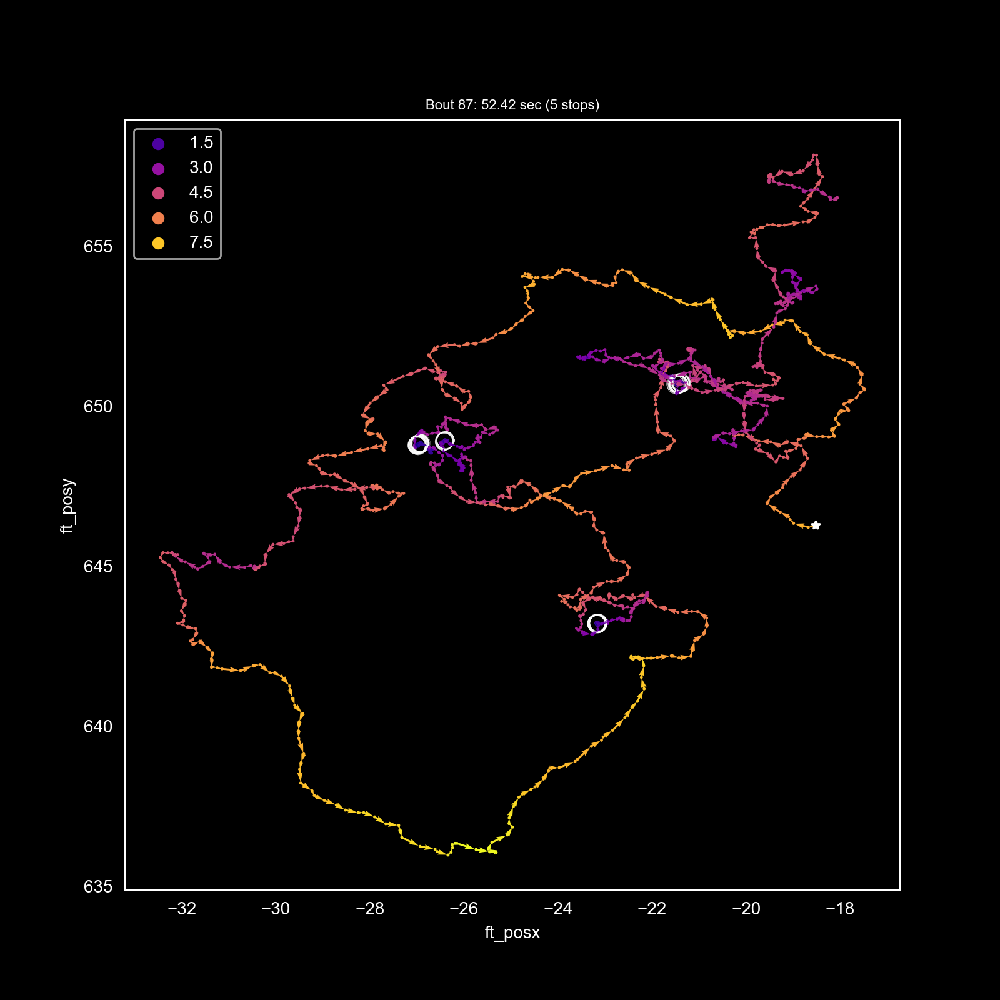

<IPython.core.display.Javascript object>


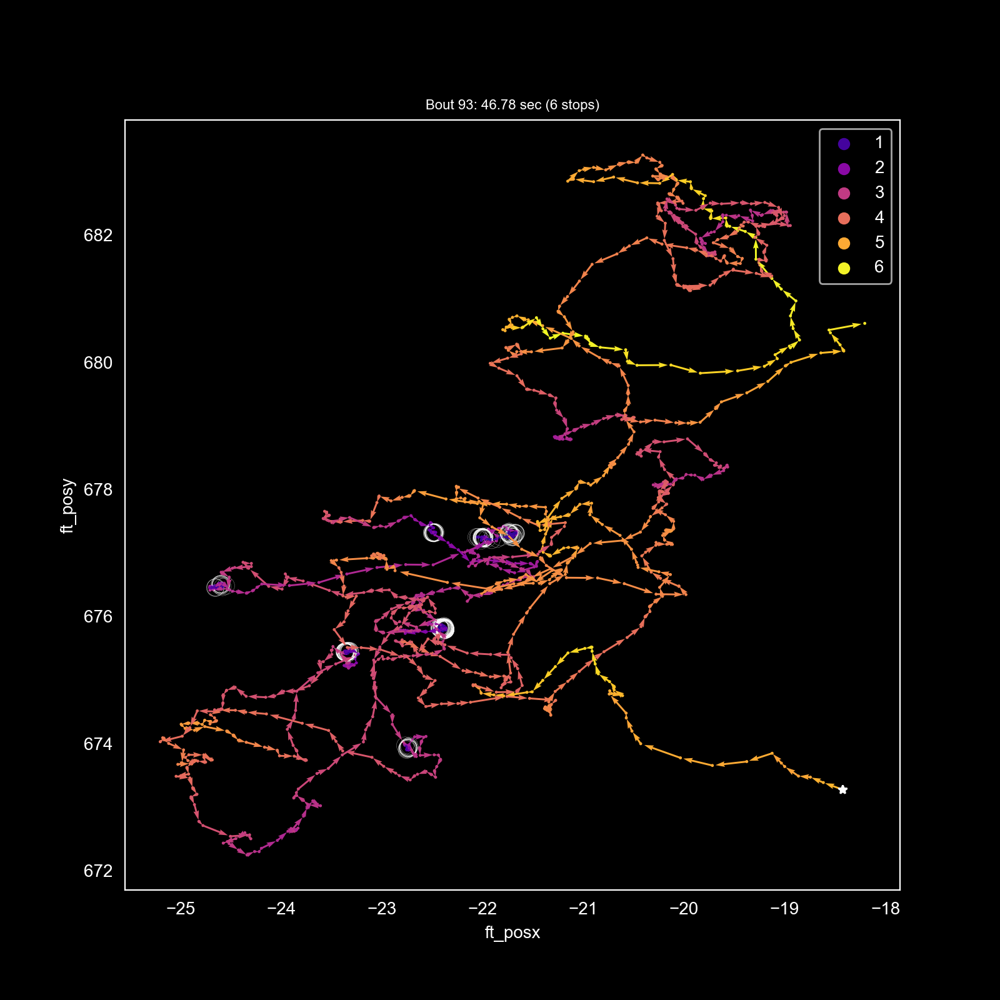

<IPython.core.display.Javascript object>


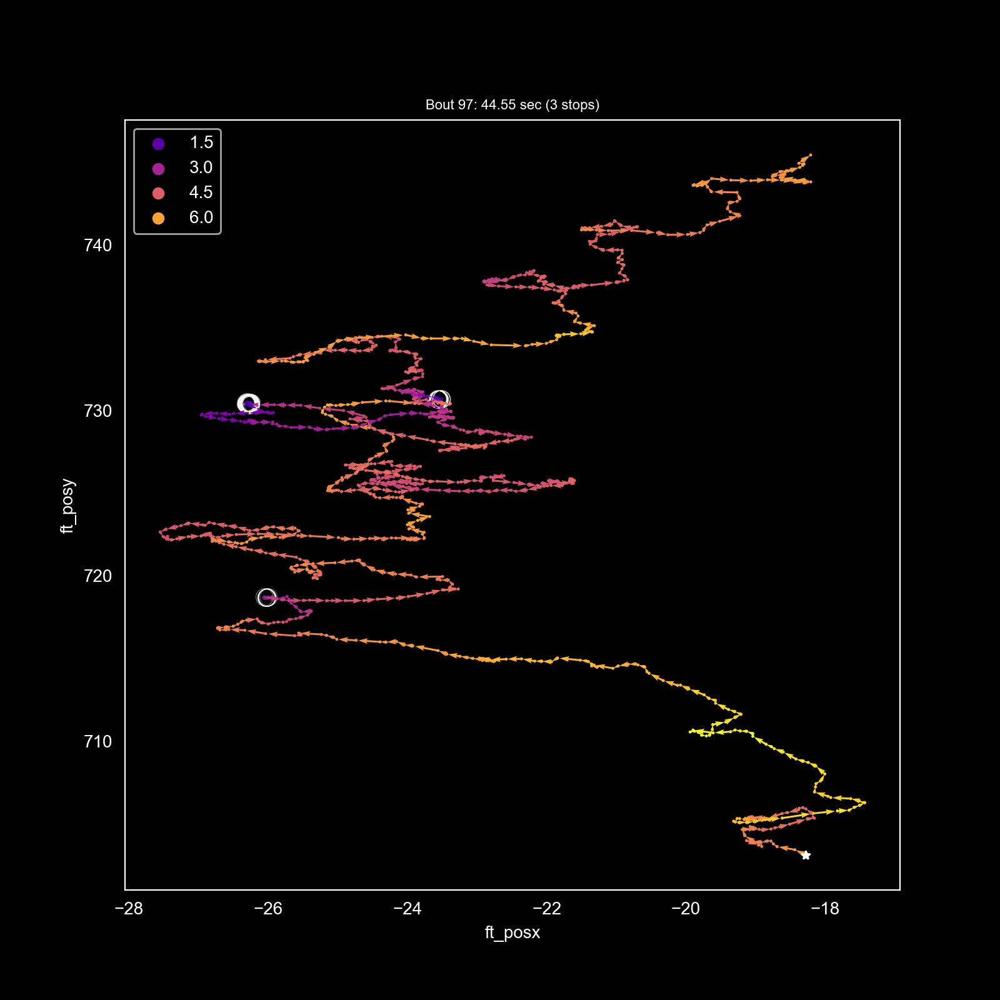

<IPython.core.display.Javascript object>


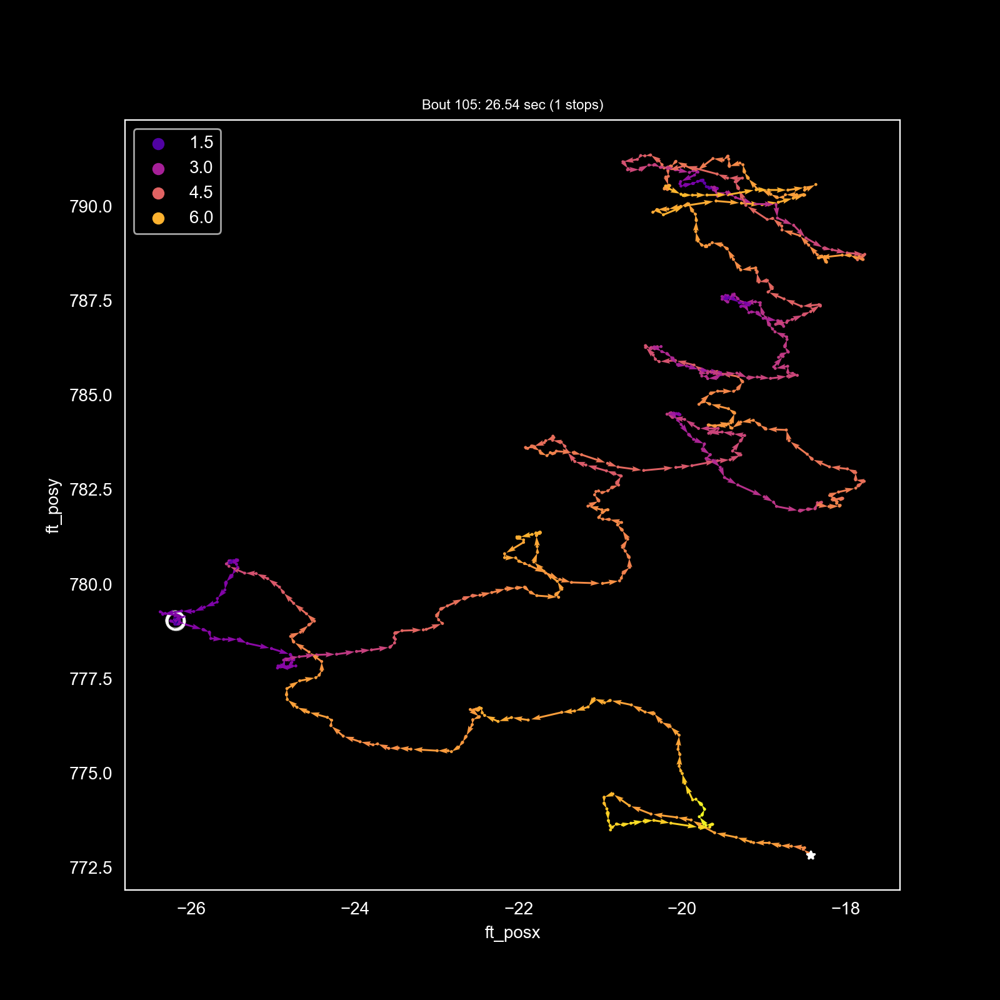

<IPython.core.display.Javascript object>


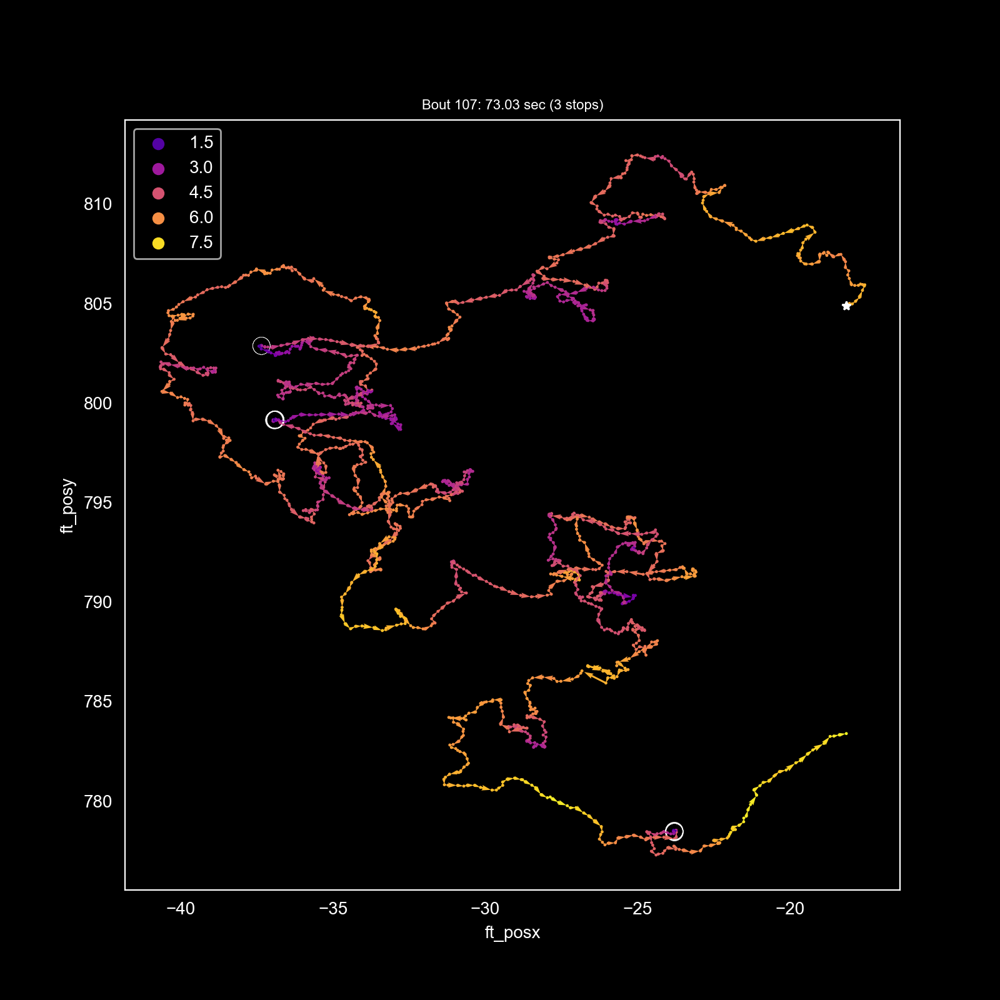

<IPython.core.display.Javascript object>


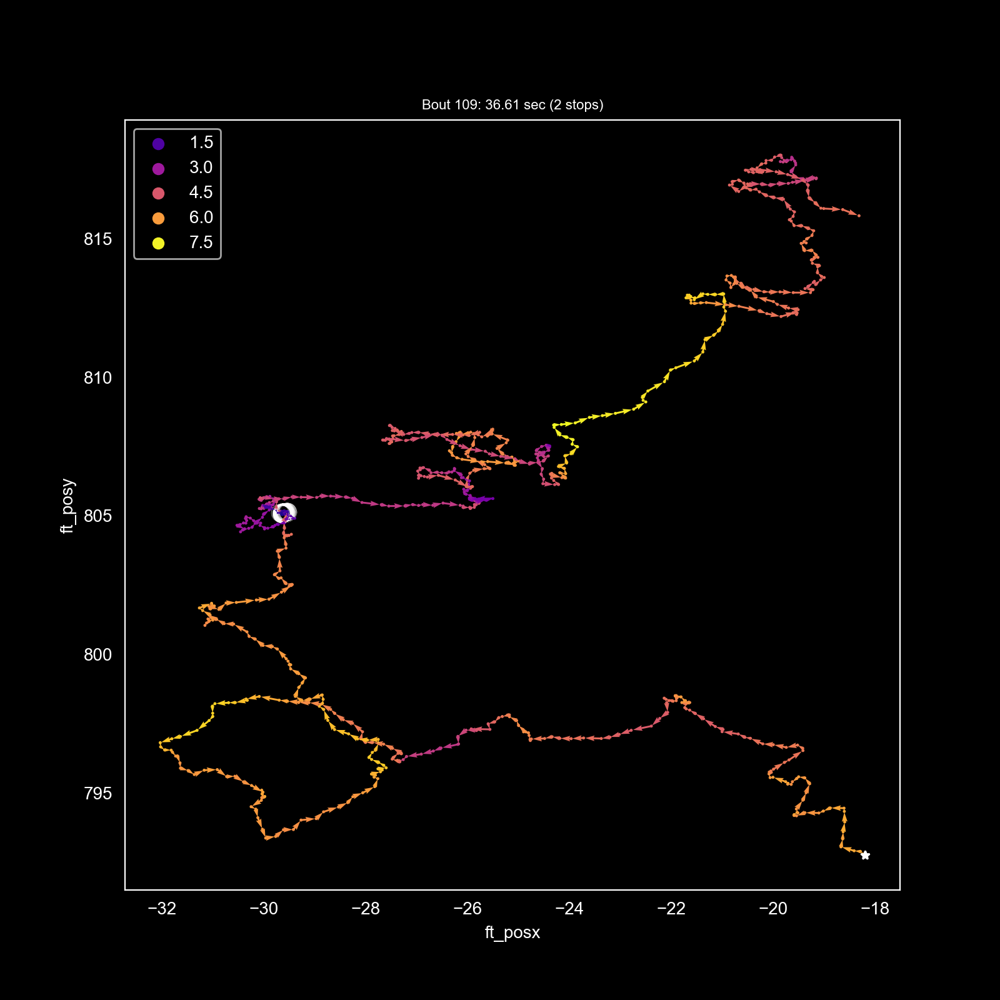

<IPython.core.display.Javascript object>


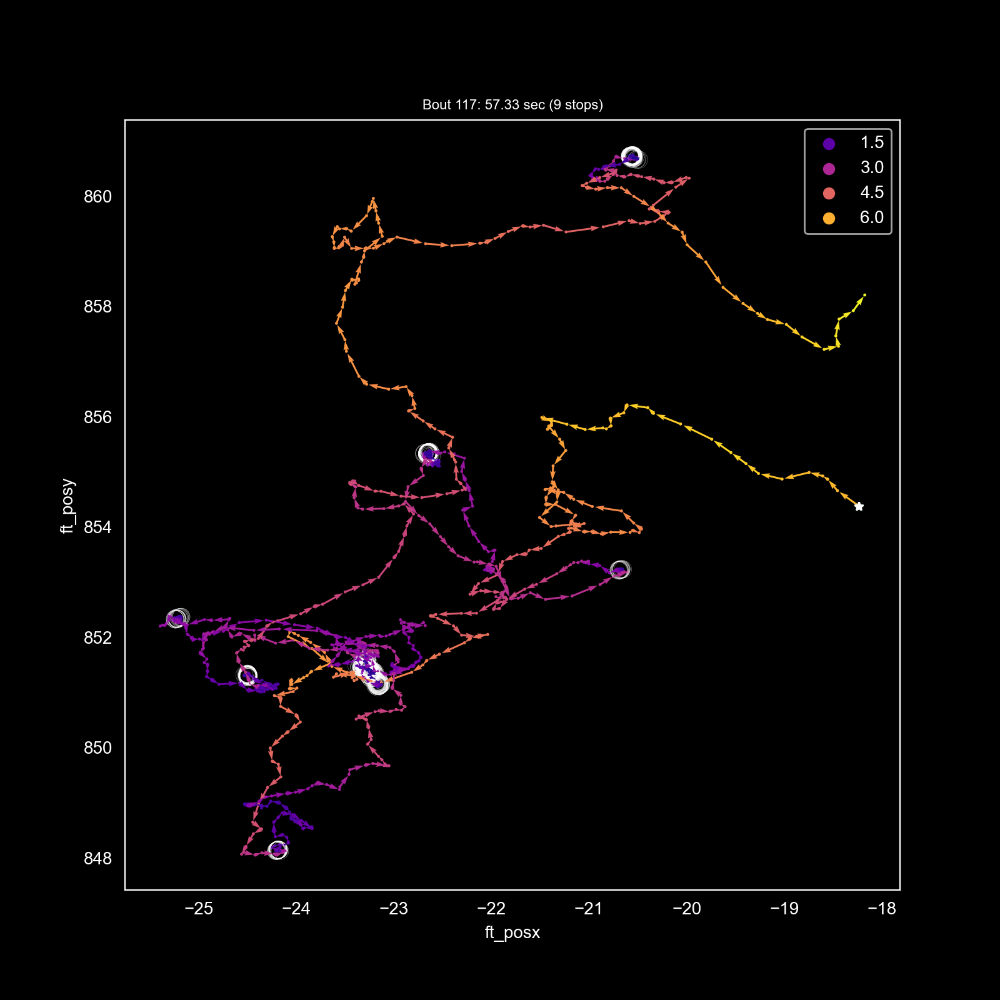

<IPython.core.display.Javascript object>


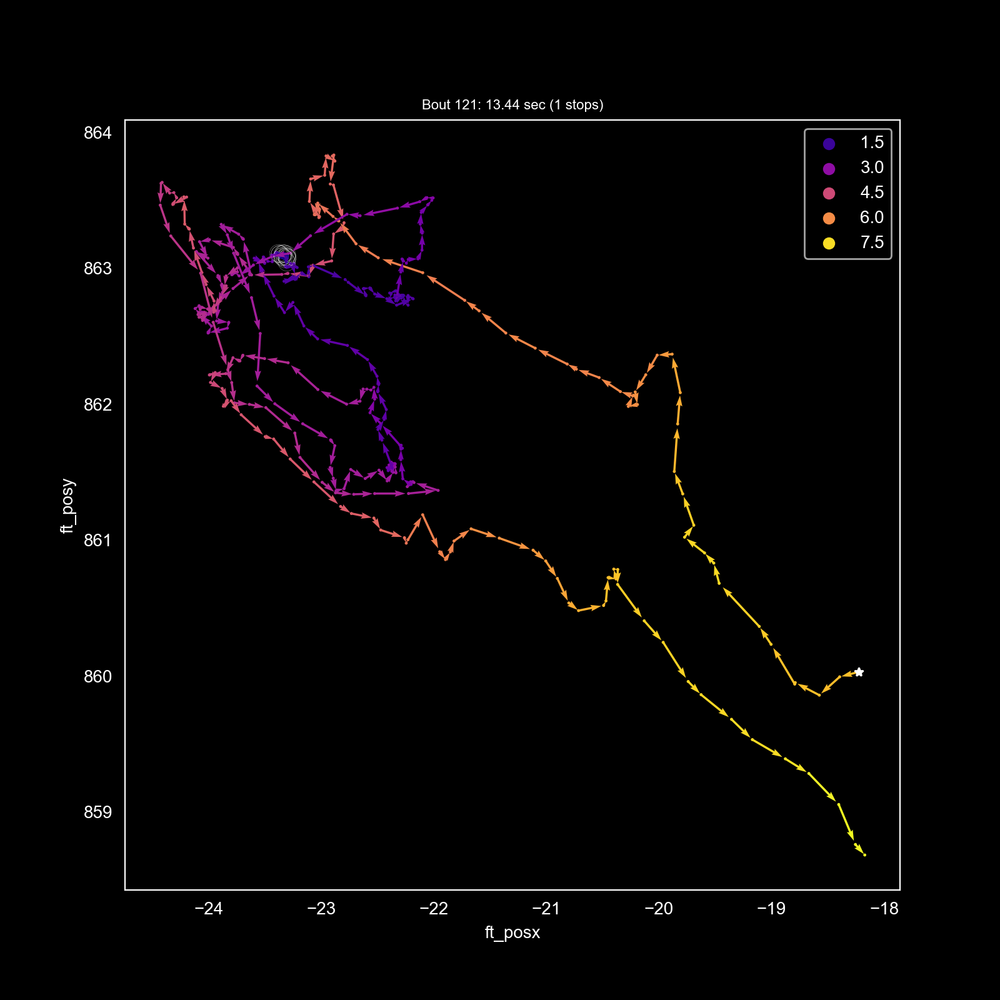

<IPython.core.display.Javascript object>


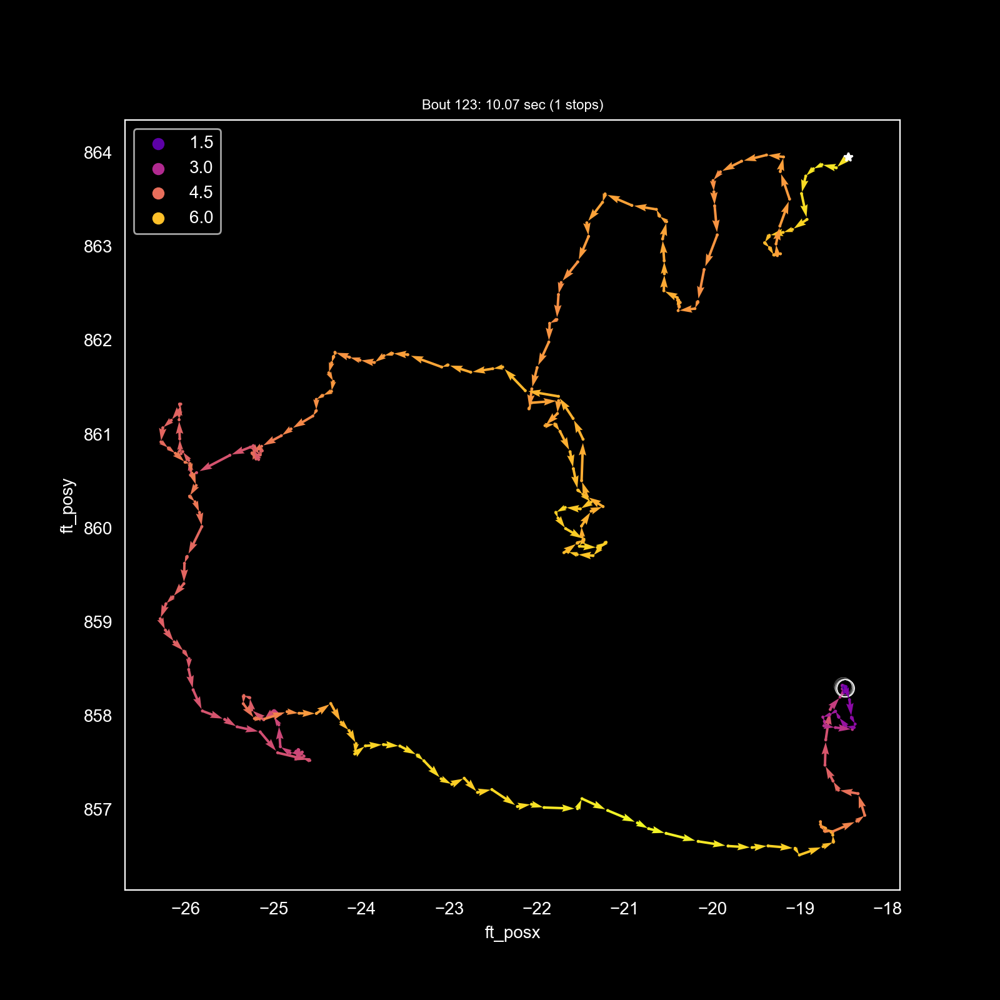

<IPython.core.display.Javascript object>


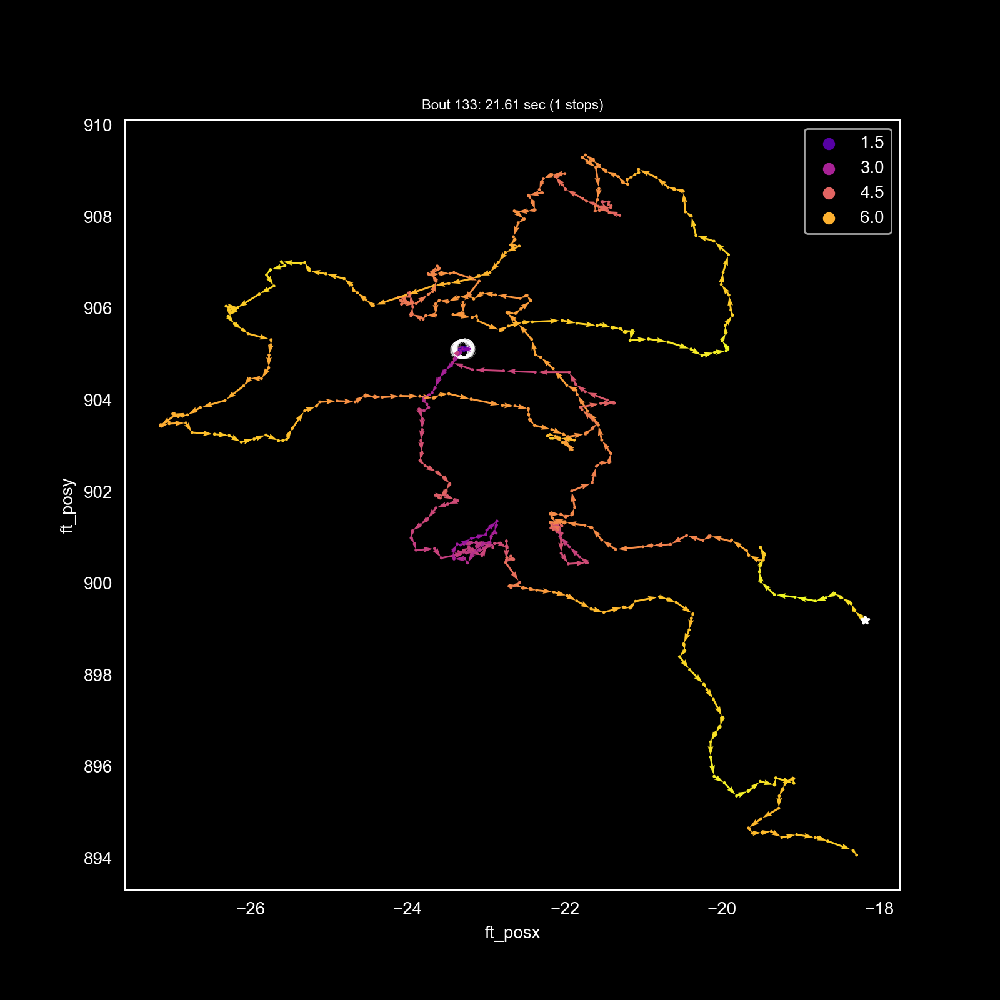

<IPython.core.display.Javascript object>


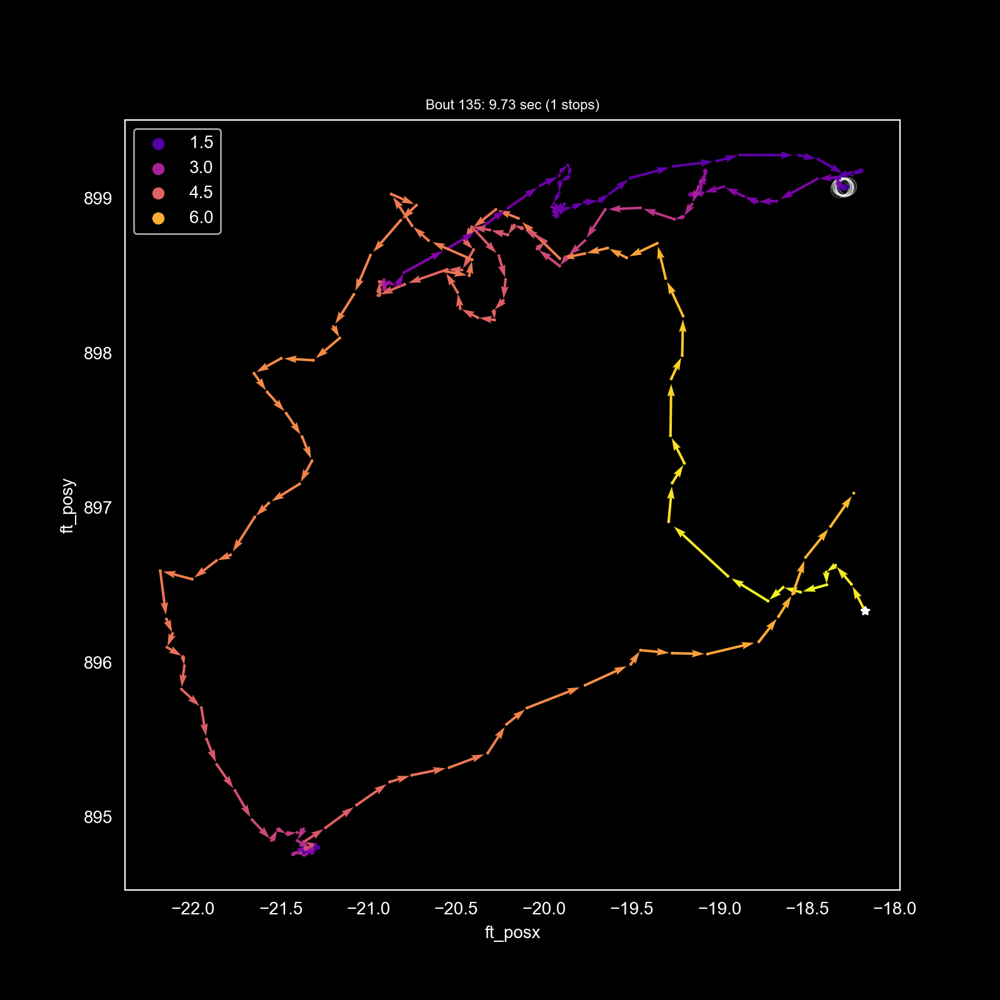

<IPython.core.display.Javascript object>


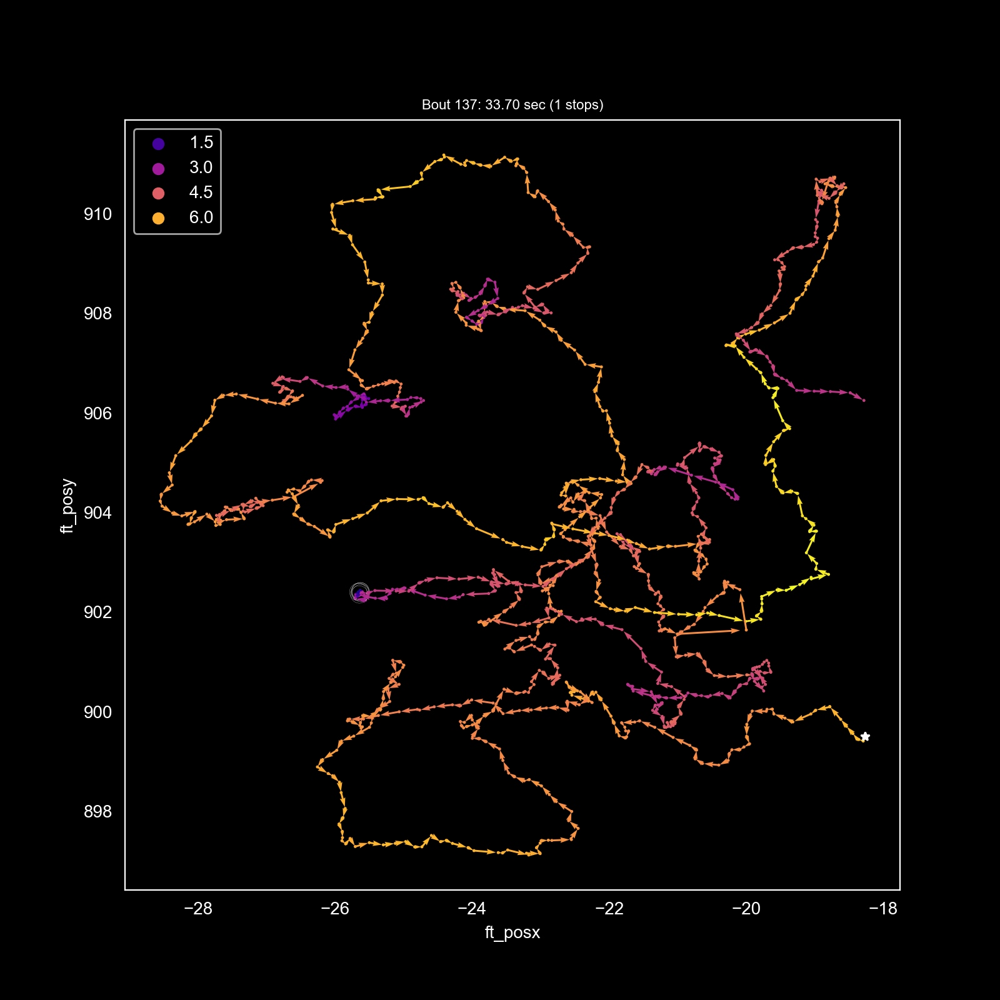

<IPython.core.display.Javascript object>


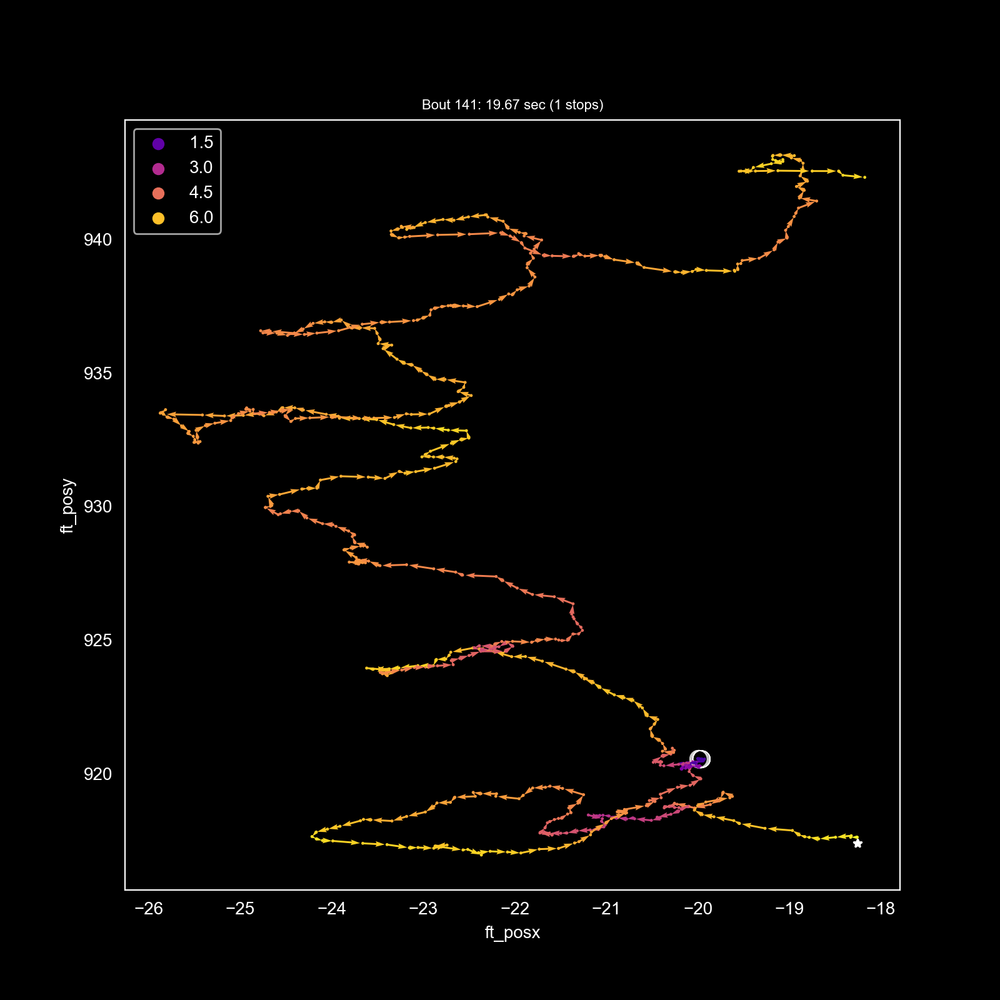

<IPython.core.display.Javascript object>


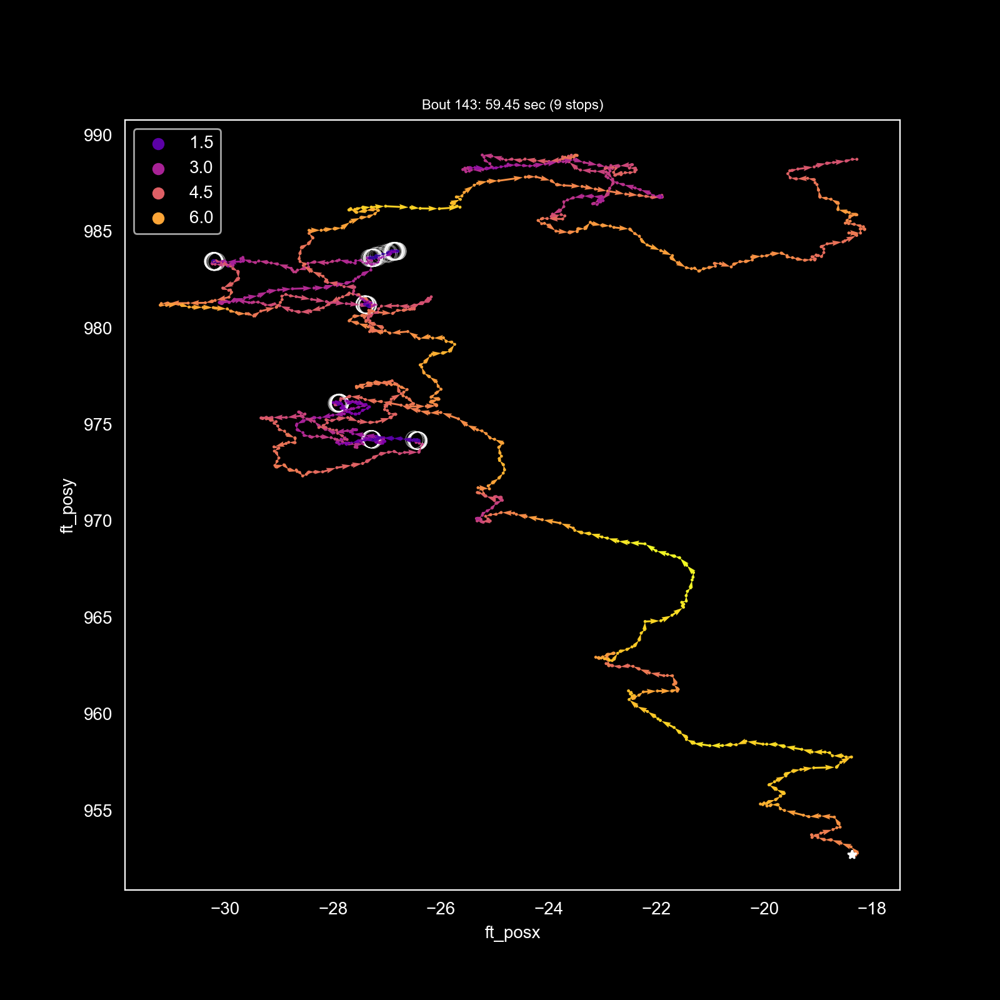

<IPython.core.display.Javascript object>


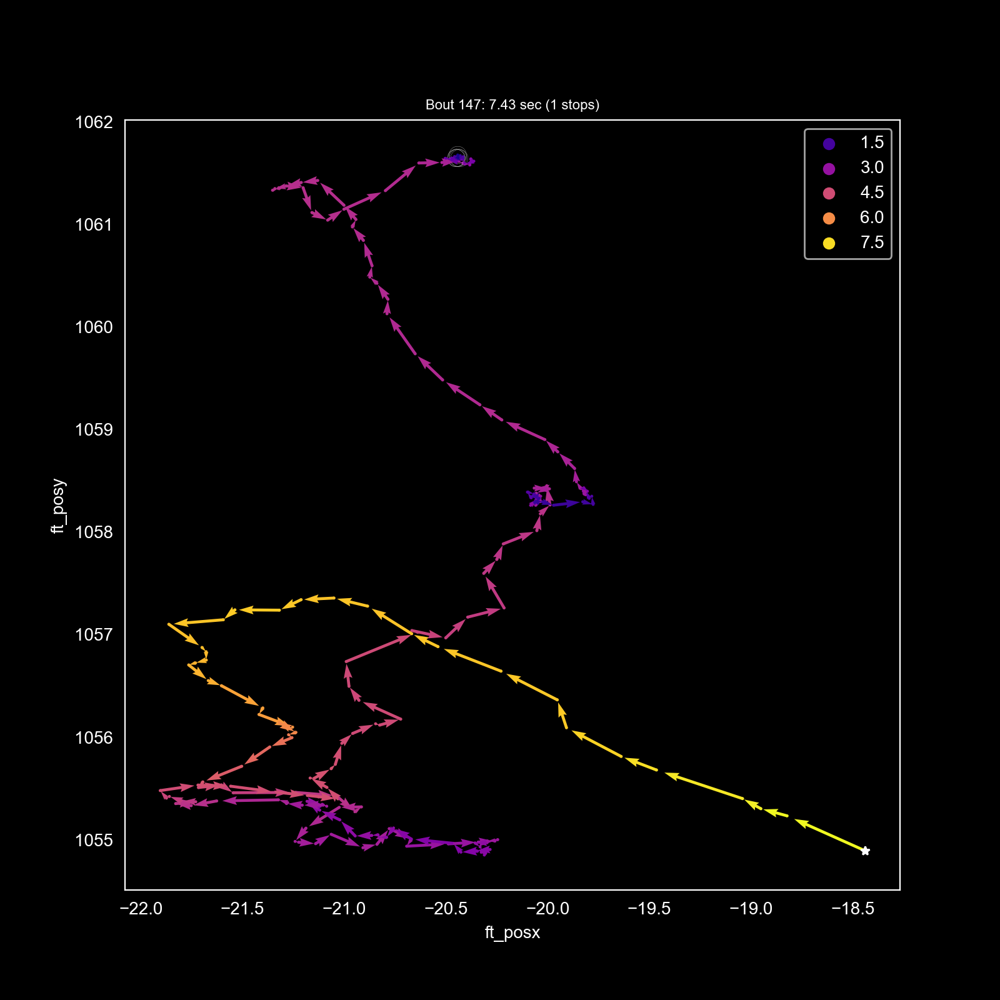

In [600]:
stop_lc='white'

hue_param='smoothed_speed'
global_colorscale=False
colormap = mpl.cm.plasma
plotdf = df[df['time']>=odor_params['odor_start_time']].copy()

if global_colorscale:
    colors=df[hue_param]
    vmin, vmax = df[~df['instrip']][hue_param].min(), df[~df['instrip']][hue_param].max()
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
# ------
#boutnum = 5
#currdf = df.groupby(['boutnum']).get_group(boutnum)
for boutnum, df_ in plotdf[~plotdf['instrip']].groupby(['boutnum']):
    # how many stops
    # df_['stop_bout'] = (df_["stopped"] != df_["stopped"].shift()).cumsum()
    nstops = int(bout_durs[bout_durs['boutnum']==boutnum]['nstops'])
    if nstops == 0:
        continue
    colors=df_[hue_param]
    if not global_colorscale:
        vmin, vmax = df_[hue_param].min(), df_[hue_param].max()
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
        
    fig, ax  = pl.subplots(figsize=(8,8))
    ax.set_title('Bout {}: {:.2f} sec ({} stops)'\
                 .format(boutnum, boutdurs[boutnum], nstops), fontsize=8)
    # Plot points
    sns.scatterplot(data=df_, x='ft_posx', y='ft_posy', hue=hue_param, 
                   palette='plasma', ax=ax, s=3, edgecolor='none')
    # Plot stop point(s)
    sns.scatterplot(data=df_[df_['stopped']], x='ft_posx', y='ft_posy', color='k', 
                    marker='o', ax=ax, s=100, edgecolor=stop_lc, linewidth=.1, facecolor='none')
    # Plot starting point
    ax.plot(df_.iloc[0]['ft_posx'], df_.iloc[0]['ft_posy'], color=stop_lc, 
                    marker='*', markersize=5)
    # plot direction
    uu = df_['ft_posx'].shift(periods=-1) - df_['ft_posx']
    vv = df_['ft_posy'].shift(periods=-1) - df_['ft_posy']
    ax.quiver(df_['ft_posx'].values, df_['ft_posy'].values, uu, vv, color=colormap(norm(colors)), 
              angles='xy', scale_units='xy', scale=1.1)
   # cbar = pl.colorbar()

In [900]:
si = currdf.index.tolist()[0]
ei = currdf.index.tolist()[-1]
fig = px.scatter(df.loc[si:ei+250], x='ft_posx', y='ft_posy', 
                 color='vel')
fig.add_vline(x=odor_xmin, line_color='white')
fig.show()